# Multi Modal Model Training - Dependent Labels

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime
import re
import emoji

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
import transformers
from transformers import BertTokenizer, BertModel, BertConfig, AdamW
from transformers import DistilBertTokenizer, DistilBertModel, DistilBertConfig
from transformers import pipeline

In [3]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler, RandomSampler, SequentialSampler, ConcatDataset
from sklearn.model_selection import KFold
import skimage

## Setup

In [4]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [5]:
one_hot.classes_

array(['Appeal to (Strong) Emotions', 'Appeal to authority',
       'Appeal to fear/prejudice', 'Bandwagon',
       'Black-and-white Fallacy/Dictatorship',
       'Causal Oversimplification', 'Doubt', 'Exaggeration/Minimisation',
       'Flag-waving', 'Glittering generalities (Virtue)',
       'Loaded Language',
       "Misrepresentation of Someone's Position (Straw Man)",
       'Name calling/Labeling',
       'Obfuscation, Intentional vagueness, Confusion',
       'Presenting Irrelevant Data (Red Herring)', 'Reductio ad hitlerum',
       'Repetition', 'Slogans', 'Smears', 'Thought-terminating cliché',
       'Transfer', 'Whataboutism'], dtype=object)

In [6]:
from CustomLoader import MultiModalLoader

In [7]:
training_data = MultiModalLoader(json_file = 'MultiModal_training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = MultiModalLoader(json_file = 'MultiModal_testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [8]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 
# 

## Initialize Tokenizer

In [9]:
do_lower_case = True
model_type = 'distilbert'
model_version = 'distilbert-base-uncased'
tokenizer = DistilBertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)

# 
# 

## Define DistilBert Class

In [10]:
class DistilBertClass(nn.Module): ### INCLUDE TOKENIZER IN CLASS
    def __init__(self):
        super(DistilBertClass, self).__init__()
        
        ### Import DistilBert Model
        distilbert = transformers.DistilBertModel.from_pretrained("distilbert-base-uncased")
        
        ### Freeze parameters
        for param in distilbert.parameters():
            param.requires_grad = False
            
        ### DistilBert encoder
        self.distil = distilbert
                        
            
        self.pre_classifier = nn.Linear(770, 3072) #768
        
        self.fc2 = nn.Linear(3072, 1024)    
        self.fc3 = nn.Linear(1024, 512)
        self.fc4 = nn.Linear(512, 128)
        
#         self.classifier = nn.Linear(128, 22)
        
        self.dropout = nn.Dropout(0.01) #.3
        
        
    def forward(self, input_ids, attention_mask, hate, sent):

        ### Run DistilBert
        distil_output = self.distil(input_ids = input_ids, attention_mask = attention_mask)

        ### Grab hidden state
        hidden_state = distil_output[0]
        x1 = hidden_state[:, 0]
        

        # prepare hidden state to append additional features (hate and sentiment; hotencoded)
        x1 = x1.view(x1.size(0), -1)
        
        ### Bring in hate and sentiment
        x2 = hate
        x3 = sent

        ### Concatenate hidden state, hate, and sentiment
        x = torch.cat((x1, x2, x3), dim=1)

        ### Run through linear layers
        fc_output = x
        fc_output = self.pre_classifier(fc_output)

        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)

        fc_output = self.fc2(fc_output)
        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)

        #GELU

        fc_output = self.fc3(fc_output)
        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)


        fc_output = self.fc4(fc_output)
        fc_output = nn.Tanh()(fc_output)  # using gelu except for the last one to allow for classification
        fc_output = self.dropout(fc_output)

#         output = self.classifier(fc_output)


        return fc_output

# 
# 
# 

## Define CNN-RNN-DB Architectures (Set Hidden Size)

### ResNet18-LSTM-DB

In [11]:
### Define Class
class ResNet18_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM-DB

In [12]:
### Define Class
class ResNet50_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM-DB

In [13]:
### Define Class
class ResNet101_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM-DB

In [14]:
### Define Class
class DenseNet121_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM-DB

In [15]:
### Define Class
class DenseNet169_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM-DB

In [16]:
### Define Class
class DenseNet201_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM-DB

In [17]:
### Define Class
class VGG11_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM-DB

In [18]:
### Define Class
class VGG16_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM-DB

In [19]:
### Define Class
class VGG19_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [20]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [21]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN_DB(CNN = None, DistilBert = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((CNN == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None) or (DistilBert == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network1 = DistilBert
            network2 = CNN
            if torch.cuda.is_available():
                network1.cuda()
                network1 = nn.DataParallel(network1, list(range(2)))
                
                network2.cuda()
                network2 = nn.DataParallel(network2, list(range(2)))
                
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer1 = transformers.Adafactor(
                network1.parameters(),
                lr=None,  # when using warm up and relative step, LR is auto determined
                eps=(1e-30, 1e-3),
                clip_threshold=1.0,
                decay_rate=-0.8, #0.8
                beta1=None, # <- used for L1 regularization
                weight_decay=0.000002, # L2 regularization, to prevent overfitting  (beta2)
                relative_step=True,
                scale_parameter=True, # https://github.com/pytorch/pytorch/issues/25081 this setting keeps the gradients from reaching 0 (using the clip threshold) (if this is enabled, must modify in training)
                warmup_init=True
            )
                        
            optimizer2 = optim.Adam(network2.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer2, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network1.train()
                network2.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, text, hate, sent, targets = data[0].to(device), data[1], data[2].to(device), data[3].to(device), data[4].float().to(device)
                    
                    optimizer1.zero_grad()
                    optimizer2.zero_grad()
                    
                    
                    ids = []
                    mask = []

                    for j in text:   
                        inputs = tokenizer.encode_plus(
                                j, 
                                None,
                                add_special_tokens = True,    
                                max_length= 512,
                                padding = "max_length",
                                pad_to_max_length = True,
                                return_token_type_ids= False)

                        ids.append(inputs['input_ids'])
                        mask.append(inputs['attention_mask'])

                    ids = torch.from_numpy(np.array(ids)).to(device)
                    mask = torch.from_numpy(np.array(mask)).to(device)

                    distil_output = network1(ids, mask, hate, sent)

                    output = network2(images, distil_output)

                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer1.step()
                    optimizer2.step()
                    
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network1.eval()
                network2.eval()
                
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, text, hate, sent, targets = data[0].to(device), data[1], data[2].to(device), data[3].to(device), data[4].float().to(device)
                    
                    ids = []
                    mask = []
                    
                    for j in text:   
                        inputs = tokenizer.encode_plus(
                                j, 
                                None,
                                add_special_tokens = True,    
                                max_length= 512,
                                padding = "max_length",
                                pad_to_max_length = True,
                                return_token_type_ids= False)

                        ids.append(inputs['input_ids'])
                        mask.append(inputs['attention_mask'])

                    ids = torch.from_numpy(np.array(ids)).to(device)
                    mask = torch.from_numpy(np.array(mask)).to(device)

                    distil_output = network1(ids, mask, hate, sent)

                    output = network2(images, distil_output)
                    
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network1.state_dict(), 'BestCnnRnnDBModels/DB_' + model_name[:-3] + '.pt')
                    torch.save(network2.state_dict(), 'BestCnnRnnDBModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer2), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('MultiModal_DependentLabels_500_1_50_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 50%

In [22]:
DB_resnet18 = DistilBertClass()
DB_resnet50 = DistilBertClass()
DB_resnet101 = DistilBertClass()

DB_densenet121 = DistilBertClass()
DB_densenet169 = DistilBertClass()
DB_densenet201 = DistilBertClass()

DB_vgg11bn = DistilBertClass()
DB_vgg16bn = DistilBertClass()
DB_vgg19bn = DistilBertClass()

resnet18LSTM_500_1_50 = ResNet18_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet50LSTM_500_1_50 = ResNet50_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet101LSTM_500_1_50 = ResNet101_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)

densenet121LSTM_500_1_50 = DenseNet121_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet169LSTM_500_1_50 = DenseNet169_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet201LSTM_500_1_50 = DenseNet201_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_500_1_50 = VGG11_BN_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_500_1_50 = VGG16_BN_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_500_1_50 = VGG19_BN_LSTM_DB(hiddenSize = 500, numLayers = 1, dpout = 0.5)

# 
# 

## Train Models

In [23]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0172 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0574 	Validation F1 Micro: 0.0
Train F1 Marco: 0.038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1385 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1309 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0362 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0369 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.56
Train Loss: 0.0128 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

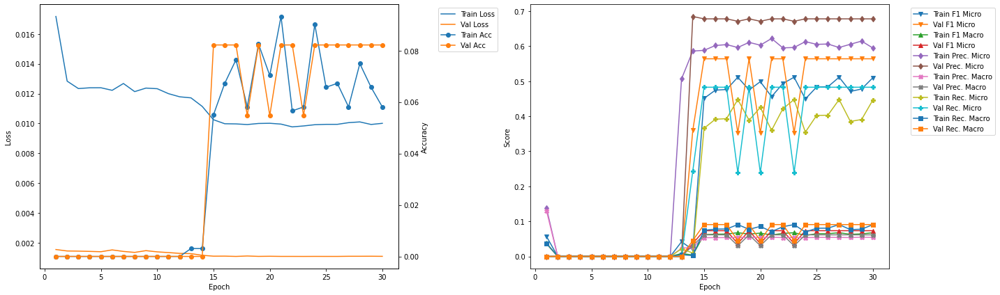

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.98
Train Loss: 0.01 	Validation Loss: 0.002
Train Accuracy: 0.055 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5131 	Validation F1 Micro: 0.3607
Train F1 Marco: 0.068 	Validation F1 Macro: 0.1224
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.2961
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.1129
Train Recall Mirco: 0.4481 	Validation Recall Micro: 0.4615
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.1644

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.24
Train Loss: 0.0106 	Validation Loss: 0.001
Train Accuracy: 0.0505 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4532 	Validation F1 Micro: 0.5513
Train F1 Marco: 0.0747 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5444 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1215 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3881 	Vali

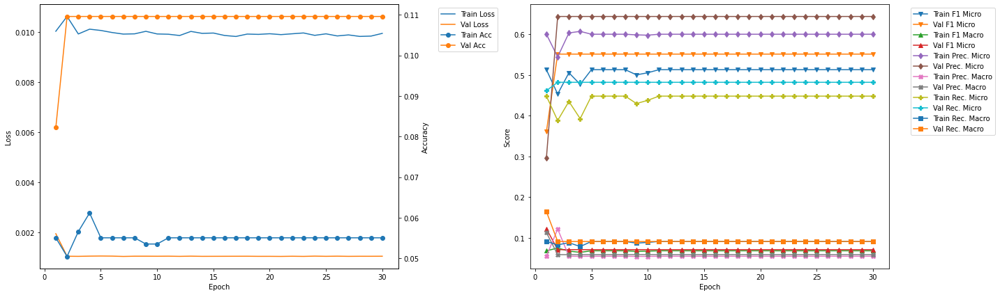

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.64
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5098 	Validation F1 Micro: 0.5375
Train F1 Marco: 0.068 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4394 	Validation Recall Micro: 0.4943
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.9
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4945 	Validation F1 Micro: 0.5375
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.589
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4157 	Validat

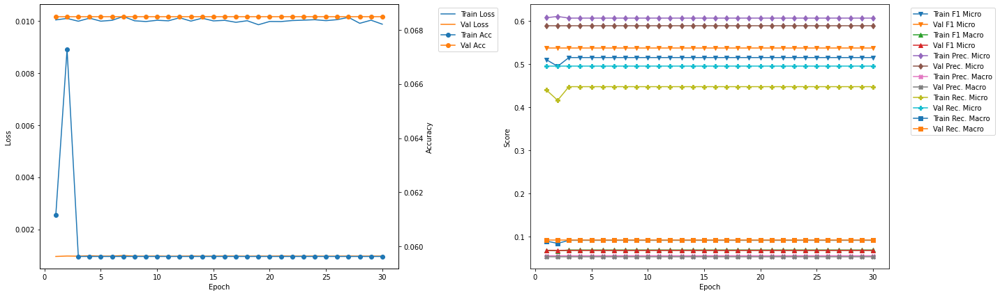

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.3
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.4929
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4552 	Validation Recall Micro: 0.4203
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.55
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.4929
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4552 

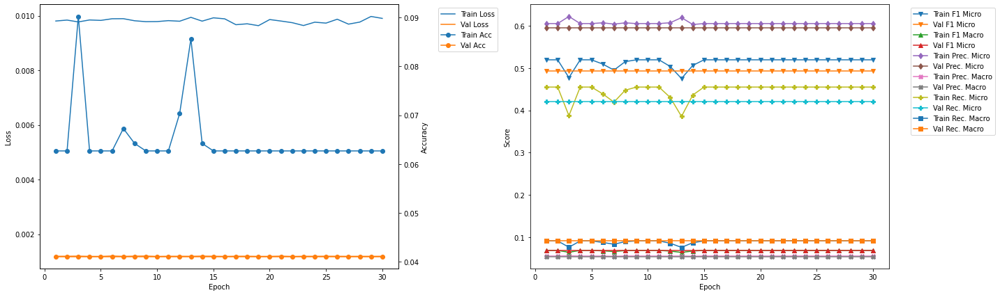

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.96
Train Loss: 0.0098 	Validation Loss: 0.0013
Train Accuracy: 0.0673 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5245 	Validation F1 Micro: 0.453
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4604 	Validation Recall Micro: 0.3796
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.22
Train Loss: 0.0098 	Validation Loss: 0.0013
Train Accuracy: 0.0673 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5245 	Validation F1 Micro: 0.453
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4604 	Vali

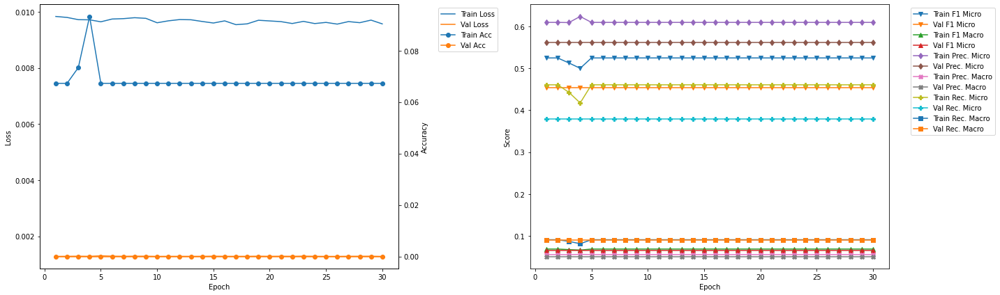

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.62
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5211 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4547 	Validation Recall Micro: 0.4219
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.88
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4976 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6179 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.41

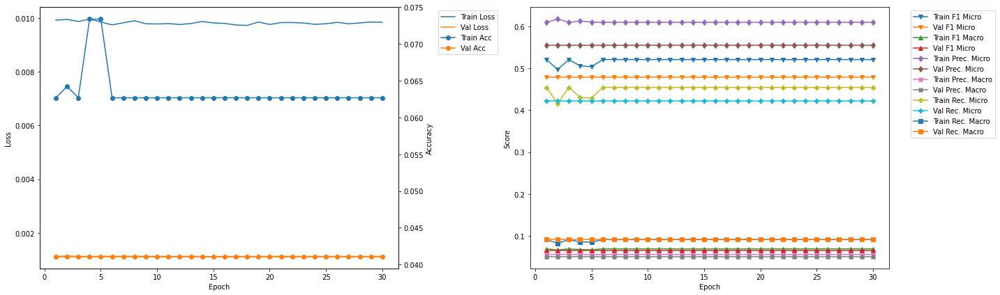

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.29
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5212 	Validation F1 Micro: 0.4804
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4571 	Validation Recall Micro: 0.4057
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.54
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5212 	Validation F1 Micro: 0.4804
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4571

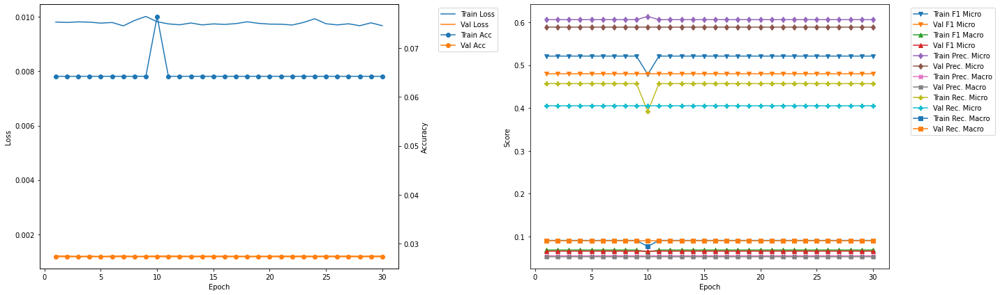

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 53.95
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4474 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.2
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4474 	Valid

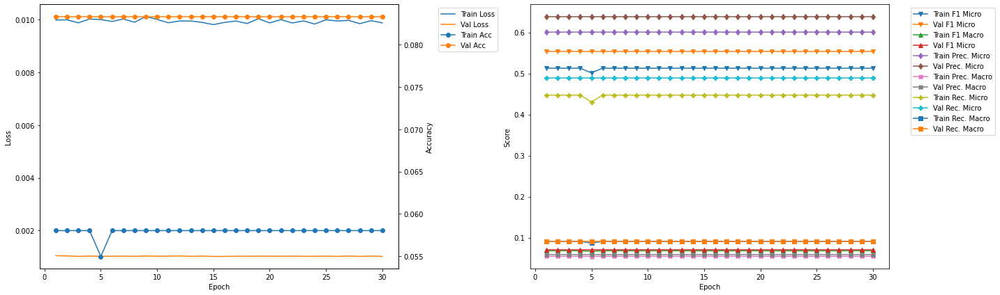

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 61.61
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.5076
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.4263 	Validation Recall Micro: 0.4536
Train Recall Marco: 0.0852 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 61.87
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5179 	Validation F1 Micro: 0.5076
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.4512

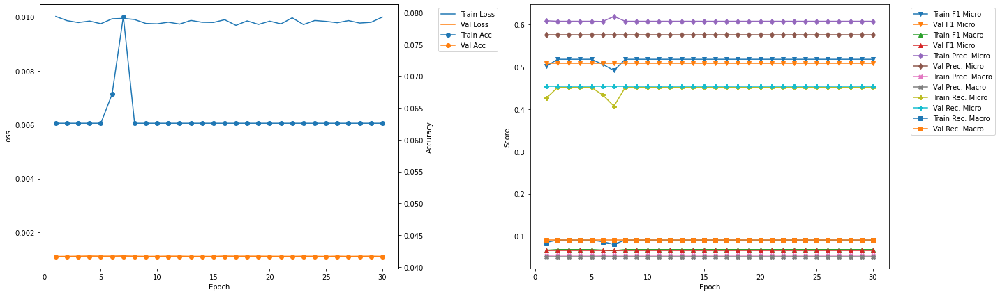

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.28
Train Loss: 0.01 	Validation Loss: 0.0009
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.558
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4458 	Validation Recall Micro: 0.5086
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.54
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.558
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4458 	Vali

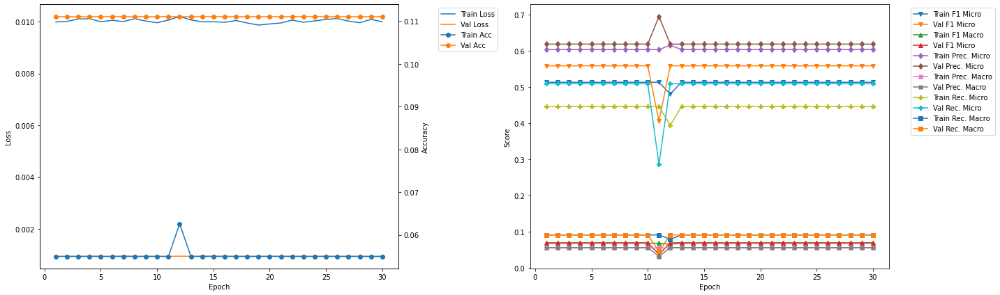

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 15
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.451 	Validation F1 Micro: 0.5641
Train F1 Marco: 0.062 	Validation F1 Macro: 0.0735
Train Precision Mirco: 0.5882 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0536 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.3657 	Validation Recall Micro: 0.4829
Train Recall Marco: 0.0745 	Validation Recall Macro: 0.0909


In [24]:
resnet18LSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = resnet18LSTM_500_1_50, DistilBert = DB_resnet18,
                                                training_data = training_data, learning_rate = 0.01,
                                                k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0175 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0546 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0383 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1247 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1127 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0349 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0369 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.55
Train Loss: 0.0132 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

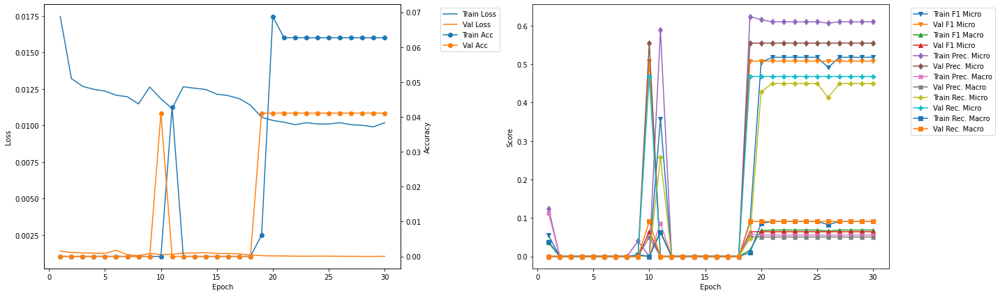

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.59
Train Loss: 0.0123 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0322 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0061 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.58 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0527 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0165 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0033 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.87
Train Loss: 0.0111 	Validation Loss: 0.0011
Train Accuracy: 0.0291 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.3763 	Validation F1 Micro: 0.3534
Train F1 Marco: 0.0538 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.5965 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0566 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.2748 	Validation Recall Mic

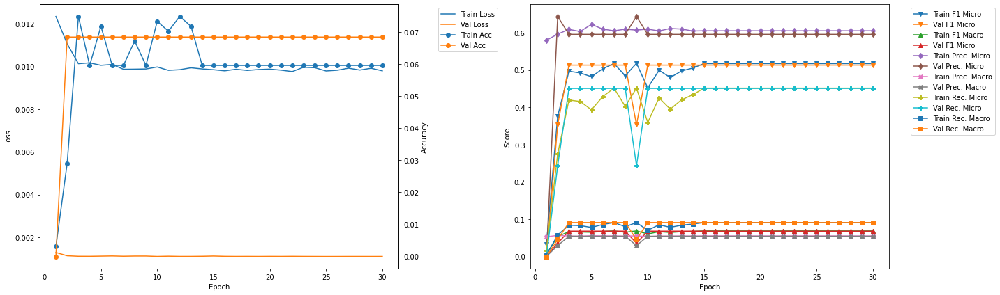

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.91
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4909 	Validation F1 Micro: 0.3404
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.412 	Validation Recall Micro: 0.2297
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.19
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4729 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3872 	V

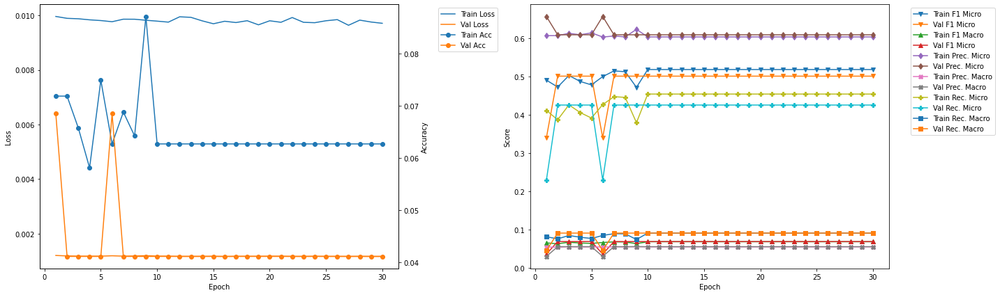

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.22
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4088 	Validation Recall Micro: 0.4404
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.5
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.508 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4361

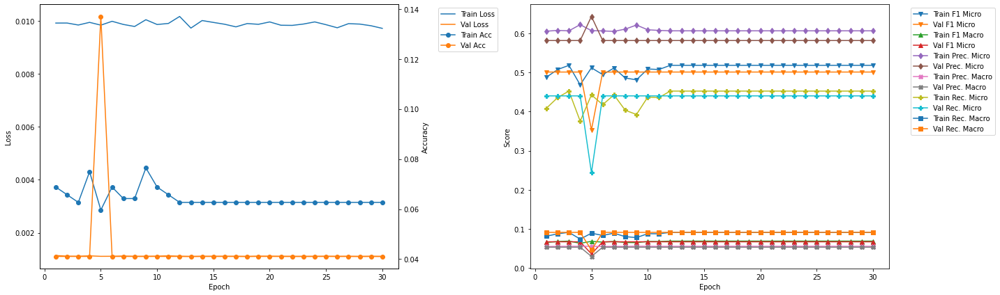

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.53
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4758 	Validation F1 Micro: 0.4723
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6314 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3817 	Validation Recall Micro: 0.4112
Train Recall Marco: 0.0741 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.81
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5219 	Validation F1 Micro: 0.4723
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.45

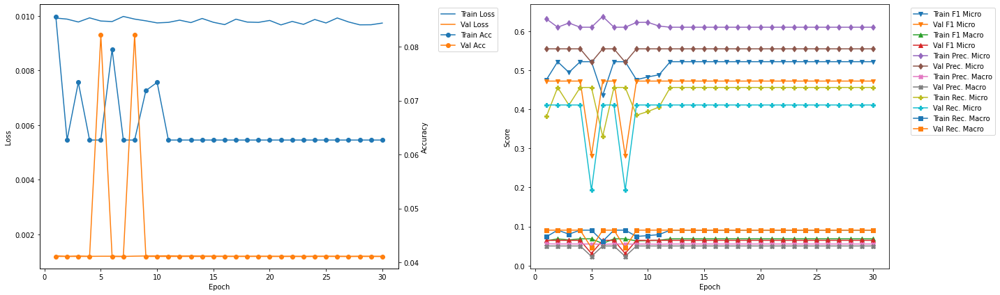

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.513274 --> 0.521994).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 41.85
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.49 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6157 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.407 	Validation Recall Micro: 0.4564
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.13
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Ma

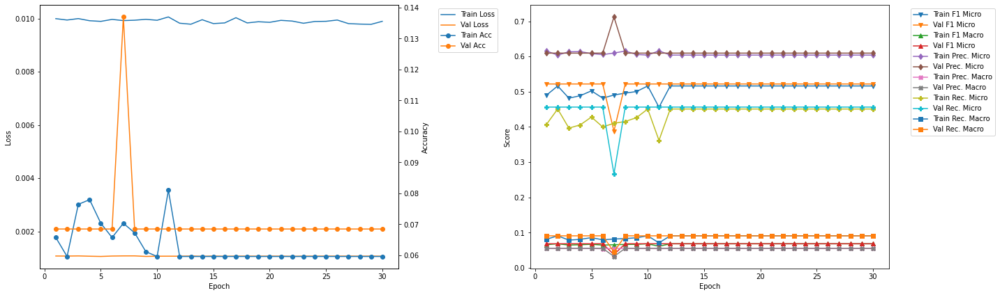

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.521994 --> 0.532164).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 50.18
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4923 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6183 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4089 	Validation Recall Micro: 0.4643
Train Recall Marco: 0.0816 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.45
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5018 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6233
Train Prec

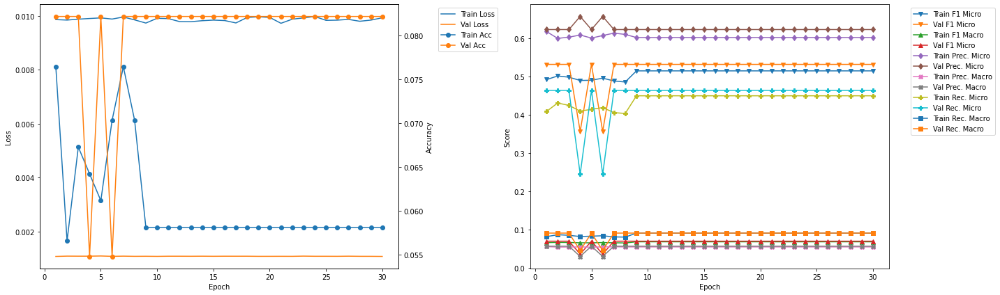

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 58.49
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0855 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4594 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.0618 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6277 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3623 	Validation Recall Micro: 0.4467
Train Recall Marco: 0.071 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 58.77
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4852 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.0647 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4069

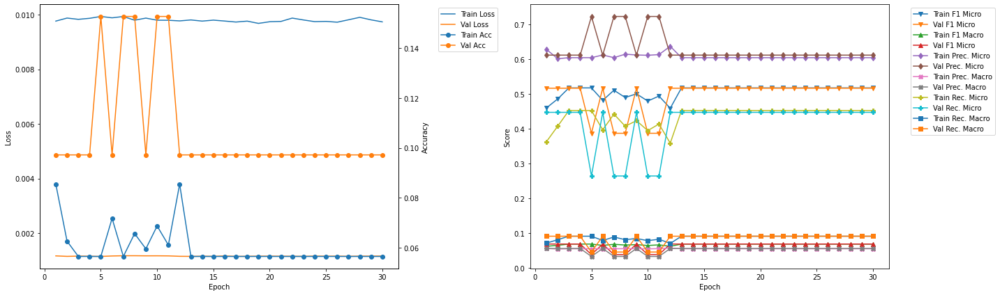

-------------------------------------------
FOLD 9
-------------------------------------------
Validation F1 Micro Score Increased (0.532164 --> 0.538462).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 66.81
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.5385
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.4204 	Validation Recall Micro: 0.4691
Train Recall Marco: 0.0843 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 67.09
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5145 	Validation F1 Micro: 0.5385
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6319
Train Precis

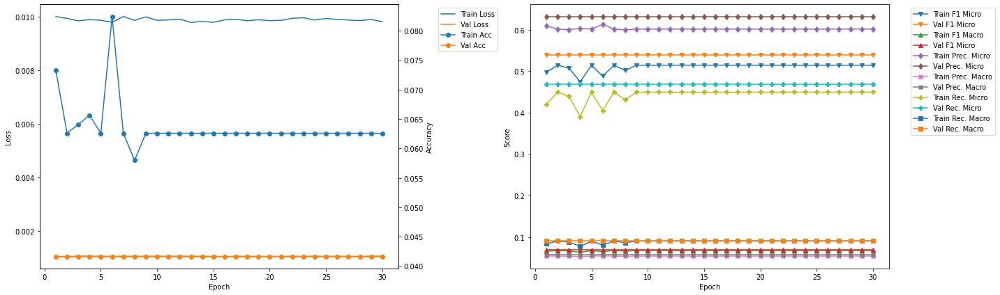

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 75.12
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4904 	Validation F1 Micro: 0.3971
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.039
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.75
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0341
Train Recall Mirco: 0.415 	Validation Recall Micro: 0.27
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.538462 --> 0.563953).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 75.41
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.564
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.

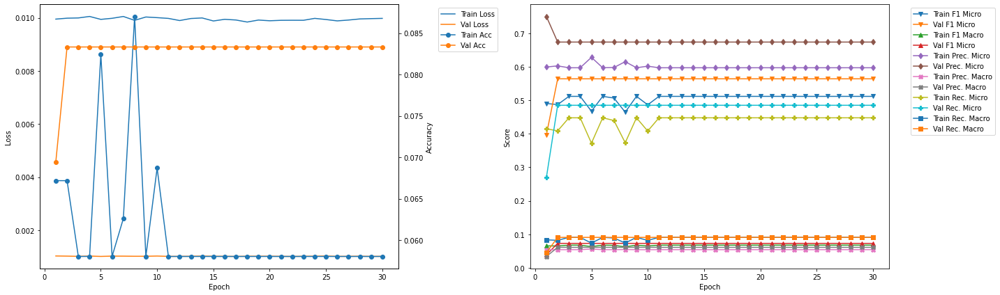

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 2
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.564
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.4087 	Validation Recall Micro: 0.485
Train Recall Marco: 0.0821 	Validation Recall Macro: 0.0909


In [25]:
resnet50LSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = resnet50LSTM_500_1_50, DistilBert = DB_resnet50, 
                                                training_data = training_data, learning_rate = 0.01, 
                                                k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0164 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.081 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0593 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1024 	Validation Precision Micro: 0.0
Train Precision Marco: 0.104 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.067 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0701 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.61
Train Loss: 0.0121 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

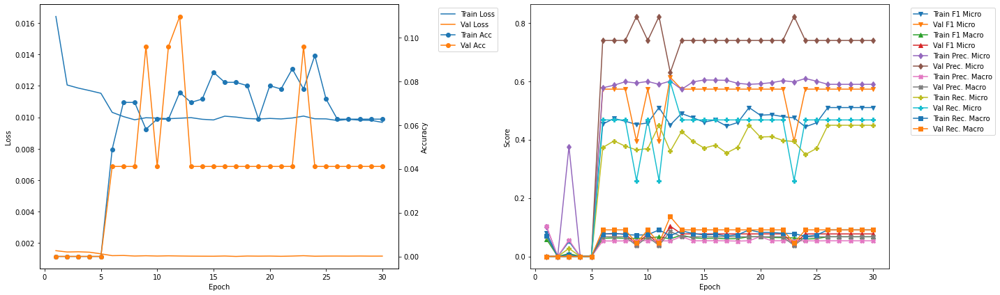

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.43
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0
Train F1 Mirco: 0.507 	Validation F1 Micro: 0.4573
Train F1 Marco: 0.0738 	Validation F1 Macro: 0.0614
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.5137
Train Precision Marco: 0.077 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.4306 	Validation Recall Micro: 0.4121
Train Recall Marco: 0.0867 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.73
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.4573
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0614
Train Precision Mirco: 0.6221 	Validation Precision Micro: 0.5137
Train Precision Marco: 0.056 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.417 	Validati

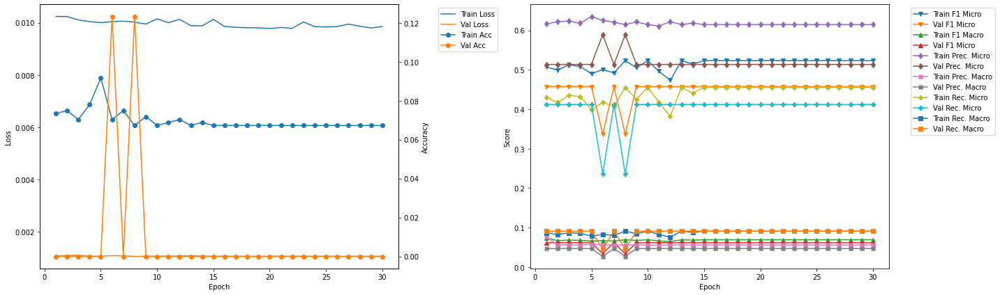

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.497 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4192 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.83
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5062 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6151 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.43 	Vali

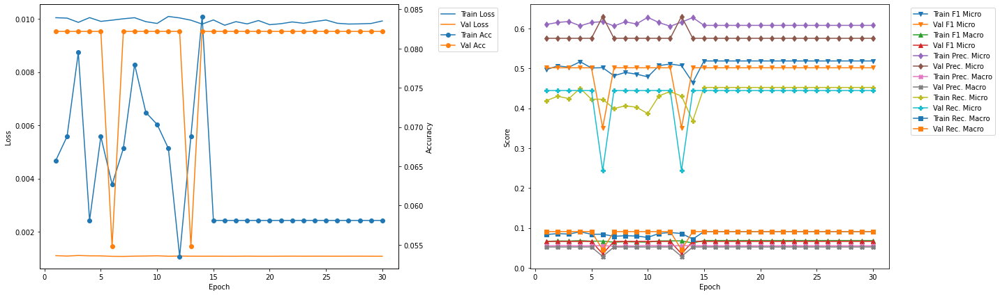

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.63
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4906 	Validation F1 Micro: 0.5059
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4073 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.0807 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.94
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5125 	Validation F1 Micro: 0.3371
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6075 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4432 	V

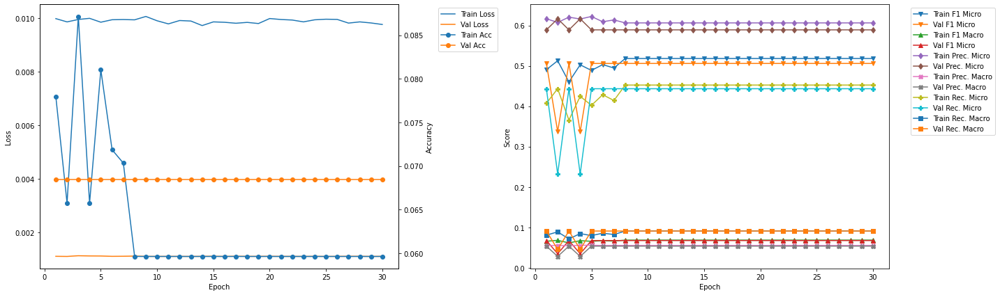

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5099 	Validation F1 Micro: 0.4892
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6137 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4362 	Validation Recall Micro: 0.4463
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.04
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5198 	Validation F1 Micro: 0.4892
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.452 	V

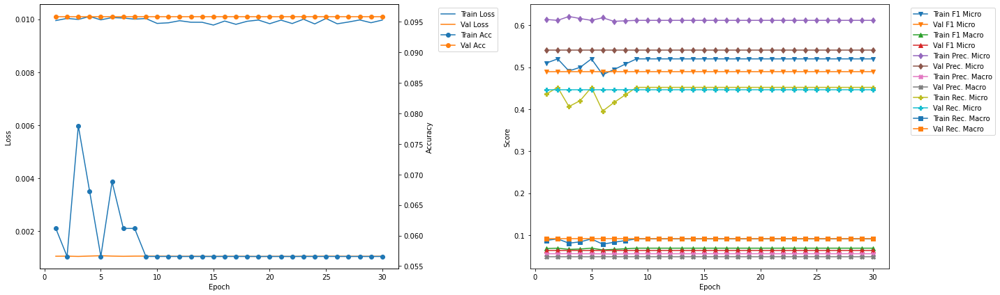

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.88
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4897 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4136 	Validation Recall Micro: 0.4845
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.19
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.471 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3845 

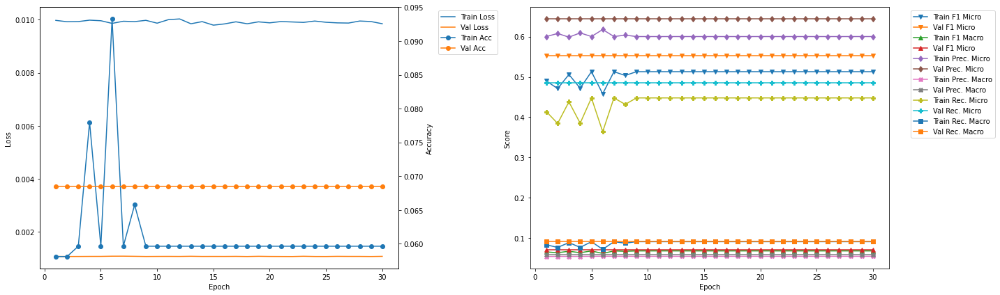

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.99
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4898 	Validation F1 Micro: 0.5172
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4109 	Validation Recall Micro: 0.4455
Train Recall Marco: 0.0816 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.29
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4816 	Validation F1 Micro: 0.5172
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.054 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4006 	V

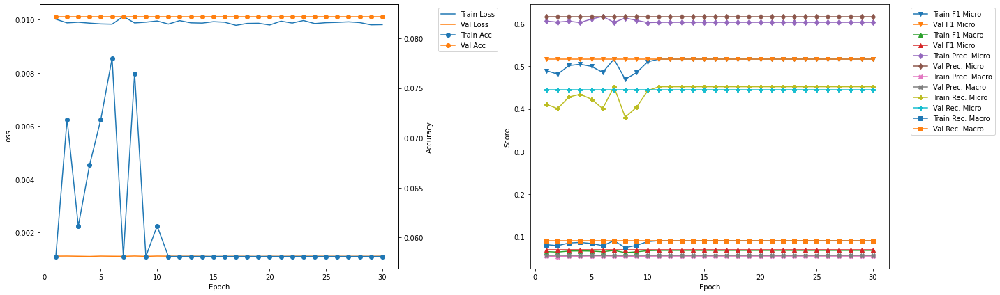

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 64.08
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4882 	Validation F1 Micro: 0.5091
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4049 	Validation Recall Micro: 0.4516
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 64.39
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5048 	Validation F1 Micro: 0.3566
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0354
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.029
Train Recall Mirco: 0.4287

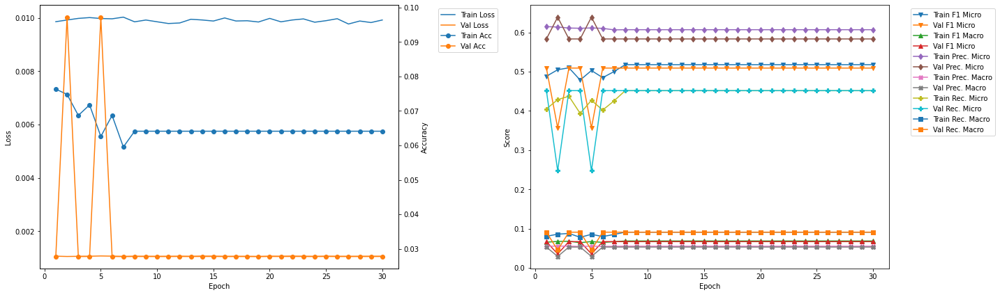

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 73.21
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0534 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.3295
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.034
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0271
Train Recall Mirco: 0.4488 	Validation Recall Micro: 0.2275
Train Recall Marco: 0.0904 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 73.52
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4777 	Validation F1 Micro: 0.5165
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6088 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3931 

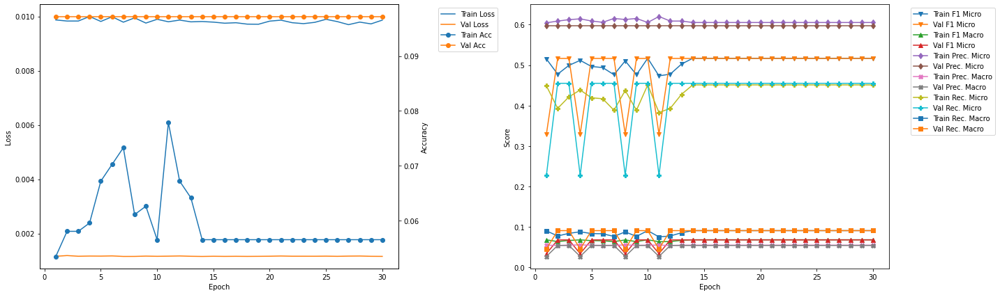

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 82.31
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4659 	Validation F1 Micro: 0.536
Train F1 Marco: 0.0624 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3779 	Validation Recall Micro: 0.4581
Train Recall Marco: 0.0745 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 82.62
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4737 	Validation F1 Micro: 0.536
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3876

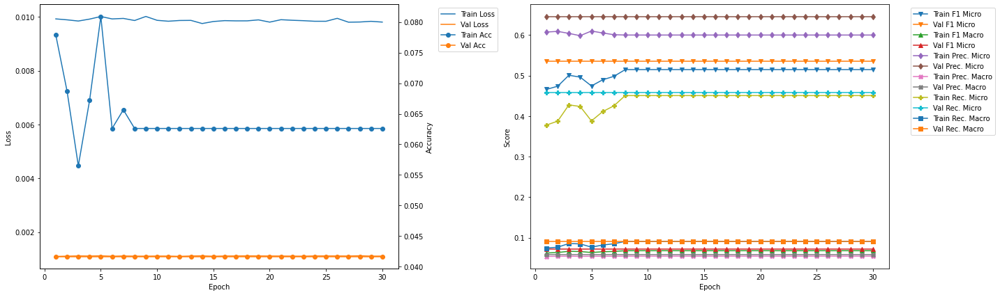

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 12
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4503 	Validation F1 Micro: 0.6133
Train F1 Marco: 0.0601 	Validation F1 Macro: 0.1036
Train Precision Mirco: 0.6006 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0529 	Validation Precision Macro: 0.0859
Train Recall Mirco: 0.3601 	Validation Recall Micro: 0.5974
Train Recall Marco: 0.0708 	Validation Recall Macro: 0.1364


In [26]:
resnet101LSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = resnet101LSTM_500_1_50, DistilBert = DB_resnet101, 
                                                 training_data = training_data, learning_rate = 0.01,
                                                 k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0184 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0884 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0616 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.129 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0699 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0619 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.57
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Valid

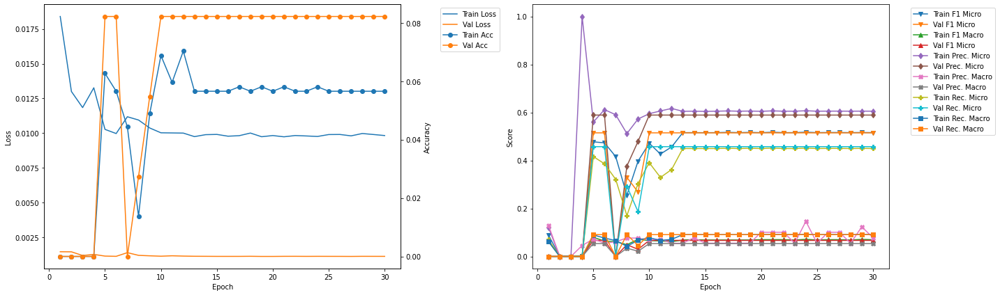

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.9
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4537 	Validation F1 Micro: 0.342
Train F1 Marco: 0.0604 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6225 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.3569 	Validation Recall Micro: 0.2347
Train Recall Marco: 0.0691 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.18
Train Loss: 0.0106 	Validation Loss: 0.0013
Train Accuracy: 0.0856 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4358 	Validation F1 Micro: 0.291
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0331
Train Precision Mirco: 0.5852 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.0918 	Validation Precision Macro: 0.0291
Train Recall Mirco: 0.3472 	V

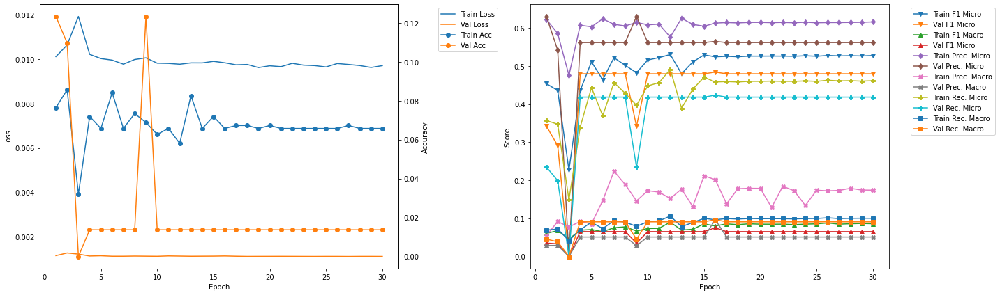

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.514970 --> 0.573964).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.52
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0535 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4764 	Validation F1 Micro: 0.574
Train F1 Marco: 0.0799 	Validation F1 Macro: 0.0819
Train Precision Mirco: 0.5906 	Validation Precision Micro: 0.6599
Train Precision Marco: 0.1927 	Validation Precision Macro: 0.1052
Train Recall Mirco: 0.3992 	Validation Recall Micro: 0.5079
Train Recall Marco: 0.0869 	Validation Recall Macro: 0.0966

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.81
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4658 	Validation F1 Micro: 0.5621
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0809
Train Precision Mirco: 0.6007 	Validation Precision Micro: 0.6463
Train Preci

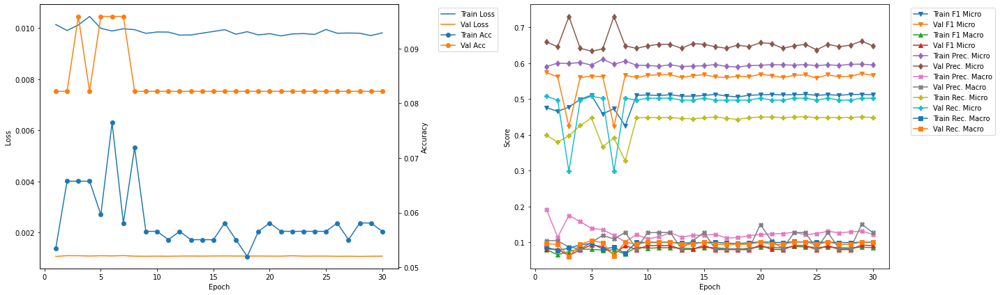

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.13
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4839 	Validation F1 Micro: 0.4676
Train F1 Marco: 0.0752 	Validation F1 Macro: 0.0755
Train Precision Mirco: 0.6197 	Validation Precision Micro: 0.557
Train Precision Marco: 0.1149 	Validation Precision Macro: 0.0738
Train Recall Mirco: 0.3969 	Validation Recall Micro: 0.4029
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.41
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5223 	Validation F1 Micro: 0.4719
Train F1 Marco: 0.0818 	Validation F1 Macro: 0.0808
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.56
Train Precision Marco: 0.1141 	Validation Precision Macro: 0.0696
Train Recall Mirco: 0.4601 	

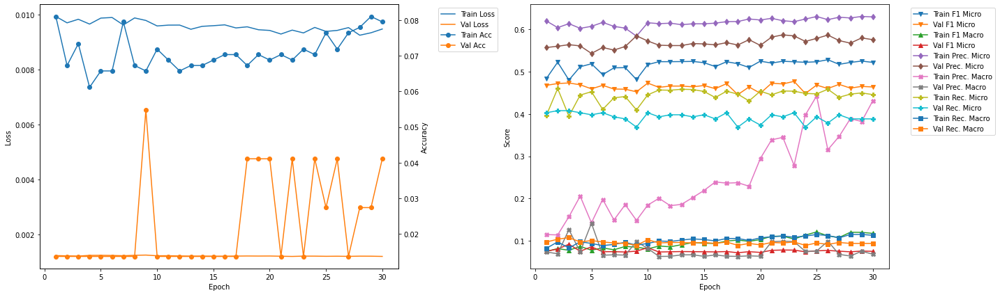

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.72
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4688 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0895 	Validation F1 Macro: 0.0864
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.6107
Train Precision Marco: 0.266 	Validation Precision Macro: 0.1479
Train Recall Mirco: 0.3822 	Validation Recall Micro: 0.4233
Train Recall Marco: 0.0884 	Validation Recall Macro: 0.0984

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.01
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4908 	Validation F1 Micro: 0.5027
Train F1 Marco: 0.0841 	Validation F1 Macro: 0.0945
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.6093
Train Precision Marco: 0.182 	Validation Precision Macro: 0.1479
Train Recall Mirco: 0.4099 	Validati

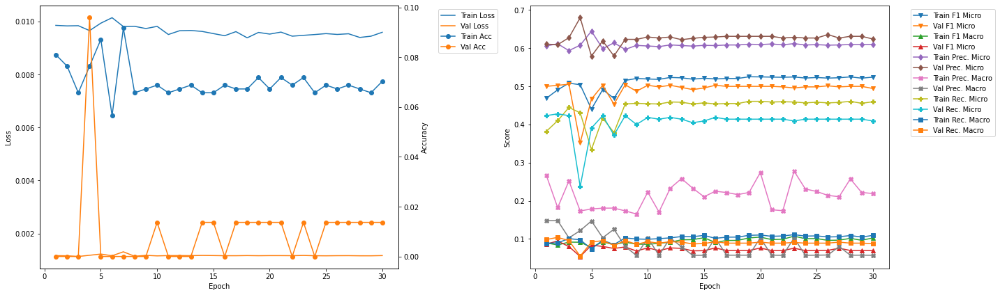

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.573964 --> 0.576577).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 43.34
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4899 	Validation F1 Micro: 0.5766
Train F1 Marco: 0.0791 	Validation F1 Macro: 0.0933
Train Precision Mirco: 0.598 	Validation Precision Micro: 0.6713
Train Precision Marco: 0.1597 	Validation Precision Macro: 0.1291
Train Recall Mirco: 0.4149 	Validation Recall Micro: 0.5053
Train Recall Marco: 0.0904 	Validation Recall Macro: 0.1009

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.62
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.5731
Train F1 Marco: 0.0896 	Validation F1 Macro: 0.0834
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.6621
Train Precision

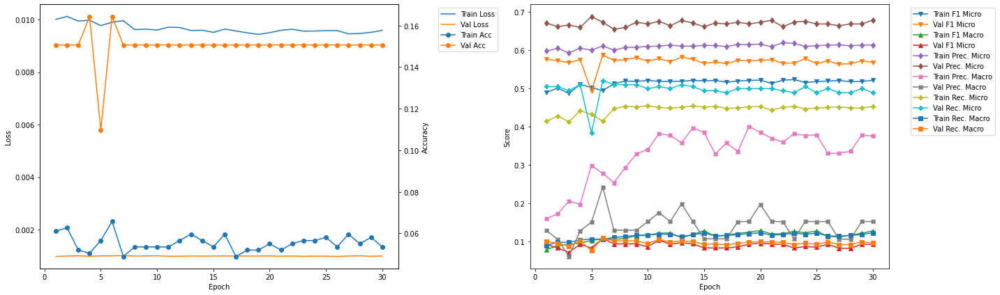

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.95
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5159 	Validation F1 Micro: 0.4353
Train F1 Marco: 0.1142 	Validation F1 Macro: 0.0745
Train Precision Mirco: 0.6186 	Validation Precision Micro: 0.5476
Train Precision Marco: 0.2858 	Validation Precision Macro: 0.0733
Train Recall Mirco: 0.4425 	Validation Recall Micro: 0.3613
Train Recall Marco: 0.113 	Validation Recall Macro: 0.0854

Epoch 2 	Learning Rate: 0.01 	Time (min): 52.24
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5096 	Validation F1 Micro: 0.4866
Train F1 Marco: 0.1086 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.623 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.2778 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.4311

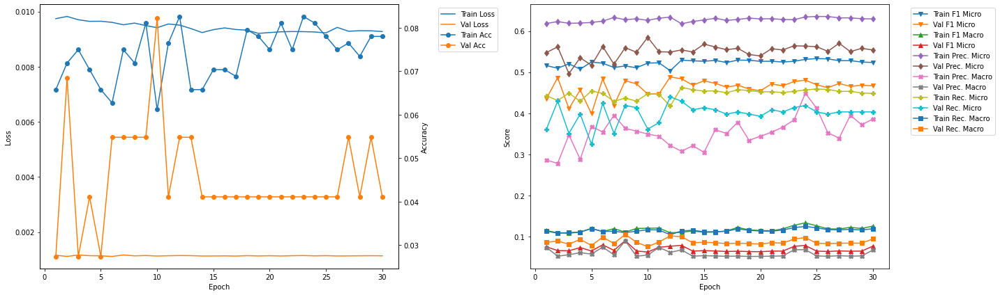

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 60.55
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5181 	Validation F1 Micro: 0.4852
Train F1 Marco: 0.1078 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6218 	Validation Precision Micro: 0.5781
Train Precision Marco: 0.2373 	Validation Precision Macro: 0.0521
Train Recall Mirco: 0.4441 	Validation Recall Micro: 0.4181
Train Recall Marco: 0.109 	Validation Recall Macro: 0.0834

Epoch 2 	Learning Rate: 0.01 	Time (min): 60.83
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5233 	Validation F1 Micro: 0.4937
Train F1 Marco: 0.107 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6234 	Validation Precision Micro: 0.5612
Train Precision Marco: 0.327 	Validation Precision Macro: 0.0744
Train Recall Mirco: 0.4508 	Val

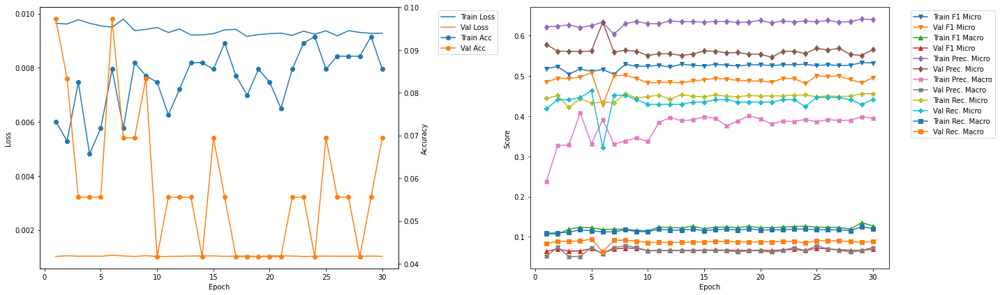

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.14
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0855 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4967 	Validation F1 Micro: 0.5575
Train F1 Marco: 0.0955 	Validation F1 Macro: 0.1461
Train Precision Mirco: 0.6183 	Validation Precision Micro: 0.669
Train Precision Marco: 0.2342 	Validation Precision Macro: 0.2237
Train Recall Mirco: 0.4151 	Validation Recall Micro: 0.4778
Train Recall Marco: 0.0981 	Validation Recall Macro: 0.1383

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.43
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0794 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5098 	Validation F1 Micro: 0.5109
Train F1 Marco: 0.1071 	Validation F1 Macro: 0.1379
Train Precision Mirco: 0.6187 	Validation Precision Micro: 0.6949
Train Precision Marco: 0.3864 	Validation Precision Macro: 0.2893
Train Recall Mirco: 0.4335 

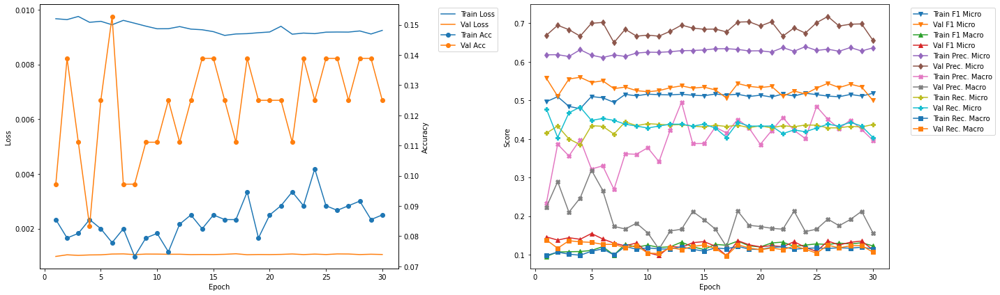

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 77.74
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.084 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5053 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.1077 	Validation F1 Macro: 0.1195
Train Precision Mirco: 0.6263 	Validation Precision Micro: 0.5874
Train Precision Marco: 0.2621 	Validation Precision Macro: 0.161
Train Recall Mirco: 0.4234 	Validation Recall Micro: 0.4421
Train Recall Marco: 0.1052 	Validation Recall Macro: 0.1429

Epoch 2 	Learning Rate: 0.01 	Time (min): 78.03
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0885 	Validation Accuracy: 0.125
Train F1 Mirco: 0.52 	Validation F1 Micro: 0.5079
Train F1 Marco: 0.114 	Validation F1 Macro: 0.0886
Train Precision Mirco: 0.6287 	Validation Precision Micro: 0.64
Train Precision Marco: 0.3193 	Validation Precision Macro: 0.1481
Train Recall Mirco: 0.4434 	Valid

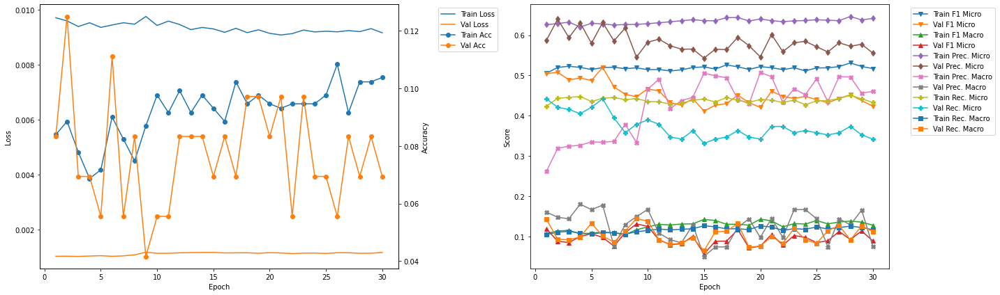

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 6
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.4949 	Validation F1 Micro: 0.5875
Train F1 Marco: 0.1076 	Validation F1 Macro: 0.1083
Train Precision Mirco: 0.6119 	Validation Precision Micro: 0.6735
Train Precision Marco: 0.2787 	Validation Precision Macro: 0.243
Train Recall Mirco: 0.4155 	Validation Recall Micro: 0.5211
Train Recall Marco: 0.1055 	Validation Recall Macro: 0.1093


In [27]:
densenet121LSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = densenet121LSTM_500_1_50, DistilBert = DB_densenet121, 
                                                   training_data = training_data, learning_rate = 0.01, 
                                                   k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0151 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0631 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0497 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1575 	Validation Precision Micro: 0.0
Train Precision Marco: 0.151 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0394 	Validation Recall Micro: 0.0
Train Recall Marco: 0.053 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.63
Train Loss: 0.012 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0048 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marc

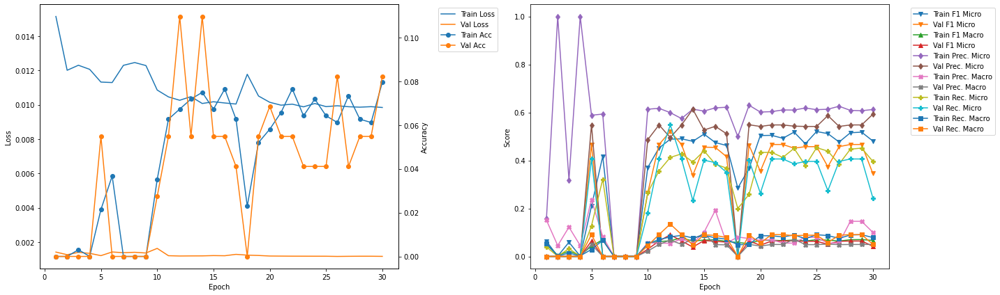

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.520482 --> 0.524862).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.72
Train Loss: 0.0113 	Validation Loss: 0.0013
Train Accuracy: 0.0306 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.2634 	Validation F1 Micro: 0.5249
Train F1 Marco: 0.0568 	Validation F1 Macro: 0.1363
Train Precision Mirco: 0.4961 	Validation Precision Micro: 0.5723
Train Precision Marco: 0.1331 	Validation Precision Macro: 0.2165
Train Recall Mirco: 0.1793 	Validation Recall Micro: 0.4847
Train Recall Marco: 0.0522 	Validation Recall Macro: 0.1465

Validation F1 Micro Score Increased (0.524862 --> 0.528190).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.05
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0505 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5083 	Validation F1 Micro: 0.5282
Train F1 Marco: 0.0799 	Validation F1 Macro: 0.06

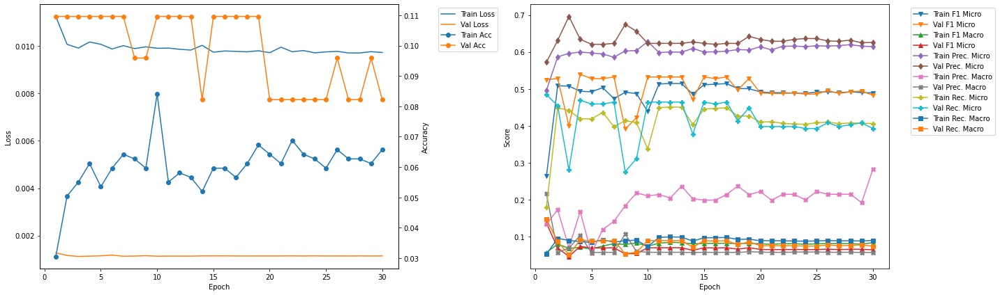

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.11
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5042 	Validation F1 Micro: 0.4545
Train F1 Marco: 0.0873 	Validation F1 Macro: 0.0599
Train Precision Mirco: 0.616 	Validation Precision Micro: 0.5469
Train Precision Marco: 0.2333 	Validation Precision Macro: 0.0488
Train Recall Mirco: 0.4267 	Validation Recall Micro: 0.3889
Train Recall Marco: 0.0951 	Validation Recall Macro: 0.0775

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.42
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4723 	Validation F1 Micro: 0.4832
Train F1 Marco: 0.0736 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.6141 	Validation Precision Micro: 0.5374
Train Precision Marco: 0.1419 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.383

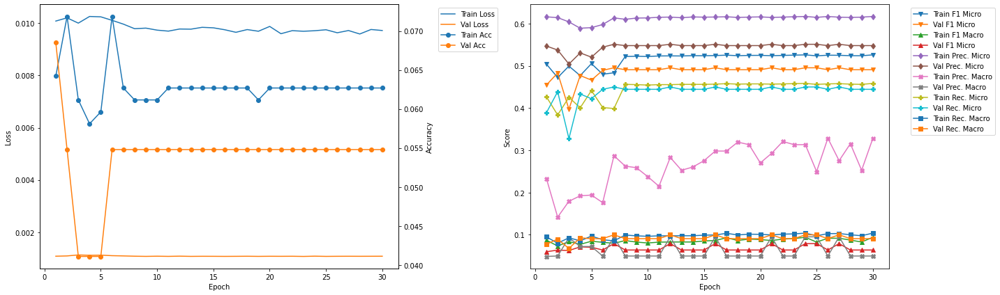

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.46
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5078 	Validation F1 Micro: 0.3267
Train F1 Marco: 0.0833 	Validation F1 Macro: 0.033
Train Precision Mirco: 0.615 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.2173 	Validation Precision Macro: 0.0259
Train Recall Mirco: 0.4324 	Validation Recall Micro: 0.2303
Train Recall Marco: 0.0937 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.77
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4846 	Validation F1 Micro: 0.3102
Train F1 Marco: 0.0806 	Validation F1 Macro: 0.0444
Train Precision Mirco: 0.6223 	Validation Precision Micro: 0.5672
Train Precision Marco: 0.1918 	Validation Precision Macro: 0.0709
Train Recall Mirco: 0.3968 	Va

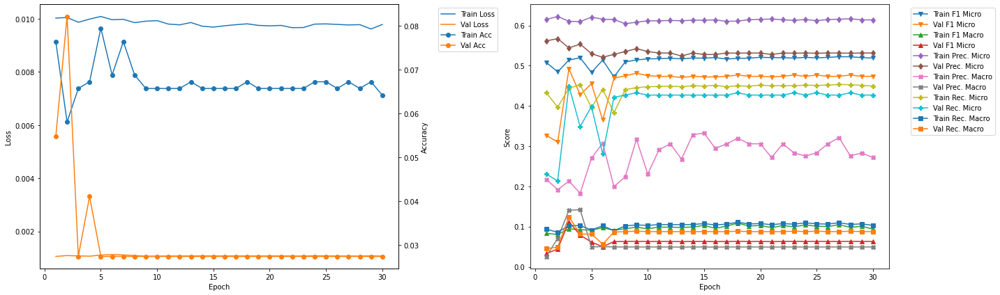

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.82
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5003 	Validation F1 Micro: 0.5279
Train F1 Marco: 0.084 	Validation F1 Macro: 0.0978
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.6
Train Precision Marco: 0.2254 	Validation Precision Macro: 0.1687
Train Recall Mirco: 0.426 	Validation Recall Micro: 0.4712
Train Recall Marco: 0.0941 	Validation Recall Macro: 0.1073

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.13
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5179 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0956 	Validation F1 Macro: 0.096
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.6159
Train Precision Marco: 0.2596 	Validation Precision Macro: 0.1911
Train Recall Mirco: 0.4522 	Vali

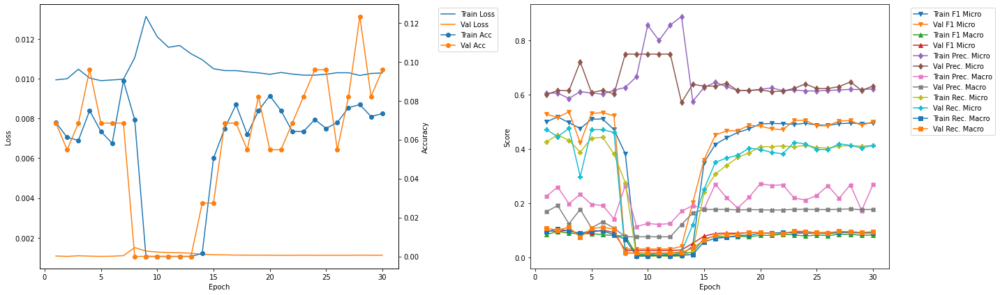

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.17
Train Loss: 0.0109 	Validation Loss: 0.0012
Train Accuracy: 0.0413 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3353 	Validation F1 Micro: 0.4404
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0756
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.5455
Train Precision Marco: 0.1672 	Validation Precision Macro: 0.0947
Train Recall Mirco: 0.2306 	Validation Recall Micro: 0.3692
Train Recall Marco: 0.0536 	Validation Recall Macro: 0.088

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.48
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.469 	Validation F1 Micro: 0.4431
Train F1 Marco: 0.0891 	Validation F1 Macro: 0.0763
Train Precision Mirco: 0.6167 	Validation Precision Micro: 0.5538
Train Precision Marco: 0.2897 	Validation Precision Macro: 0.0955
Train Recall Mirco: 0.3784 	

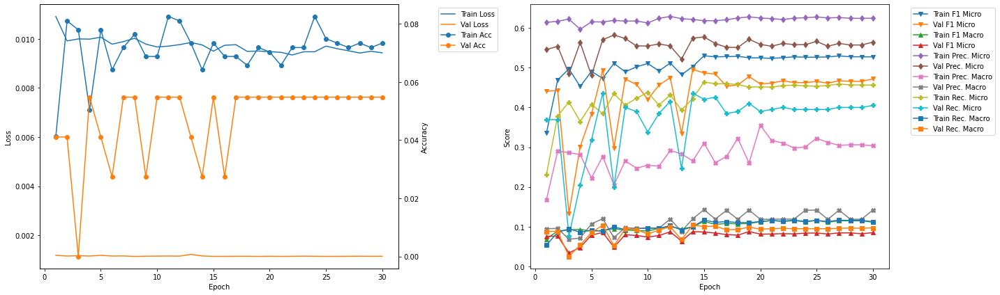

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.52
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4859 	Validation F1 Micro: 0.5307
Train F1 Marco: 0.0975 	Validation F1 Macro: 0.0951
Train Precision Mirco: 0.6143 	Validation Precision Micro: 0.6643
Train Precision Marco: 0.2562 	Validation Precision Macro: 0.1069
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.4419
Train Recall Marco: 0.0947 	Validation Recall Macro: 0.1032

Epoch 2 	Learning Rate: 0.01 	Time (min): 56.84
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5041 	Validation F1 Micro: 0.4409
Train F1 Marco: 0.0983 	Validation F1 Macro: 0.0637
Train Precision Mirco: 0.6183 	Validation Precision Micro: 0.7041
Train Precision Marco: 0.2363 	Validation Precision Macro: 0.112
Train Recall Mirco: 0.4255

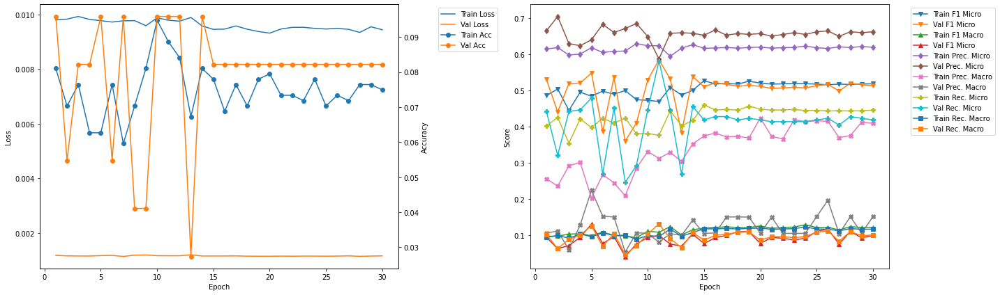

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 65.91
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.479
Train F1 Marco: 0.1064 	Validation F1 Macro: 0.0892
Train Precision Mirco: 0.6006 	Validation Precision Micro: 0.6852
Train Precision Marco: 0.2805 	Validation Precision Macro: 0.162
Train Recall Mirco: 0.429 	Validation Recall Micro: 0.3682
Train Recall Marco: 0.1049 	Validation Recall Macro: 0.0791

Epoch 2 	Learning Rate: 0.01 	Time (min): 66.22
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4698 	Validation F1 Micro: 0.5575
Train F1 Marco: 0.1047 	Validation F1 Macro: 0.0978
Train Precision Mirco: 0.6027 	Validation Precision Micro: 0.6599
Train Precision Marco: 0.2613 	Validation Precision Macro: 0.1508
Train Recall Mirco: 0.3849 	

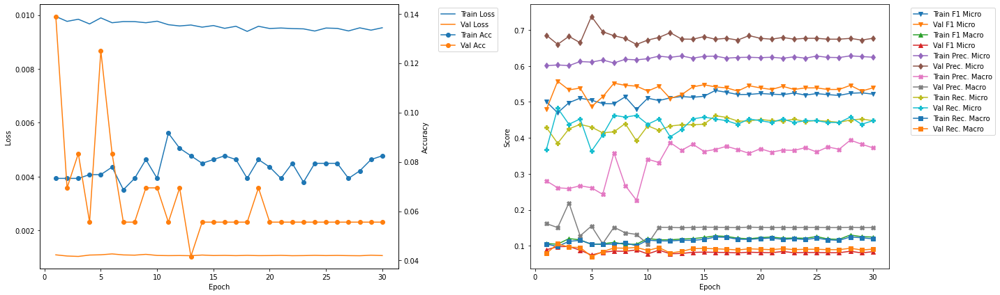

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 75.26
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4914 	Validation F1 Micro: 0.4255
Train F1 Marco: 0.1092 	Validation F1 Macro: 0.0951
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.6522
Train Precision Marco: 0.2831 	Validation Precision Macro: 0.1689
Train Recall Mirco: 0.4126 	Validation Recall Micro: 0.3158
Train Recall Marco: 0.1051 	Validation Recall Macro: 0.0809

Epoch 2 	Learning Rate: 0.01 	Time (min): 75.57
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5039 	Validation F1 Micro: 0.4848
Train F1 Marco: 0.1242 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.616 	Validation Precision Micro: 0.6729
Train Precision Marco: 0.312 	Validation Precision Macro: 0.1126
Train Recall Mirco: 0.4263 	Va

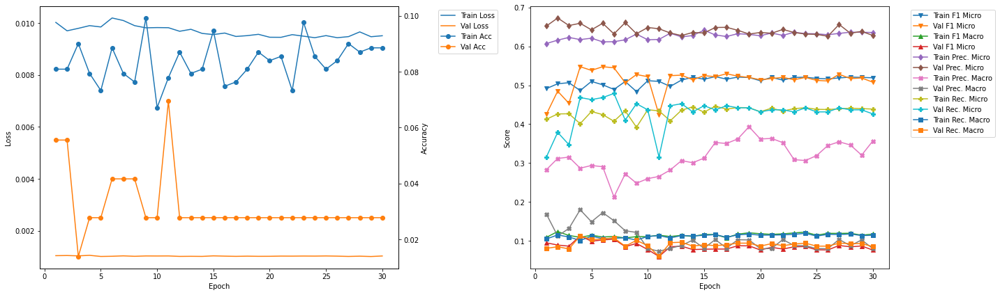

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 84.61
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4786 	Validation F1 Micro: 0.5401
Train F1 Marco: 0.1041 	Validation F1 Macro: 0.1077
Train Precision Mirco: 0.6248 	Validation Precision Micro: 0.6842
Train Precision Marco: 0.2338 	Validation Precision Macro: 0.1332
Train Recall Mirco: 0.3878 	Validation Recall Micro: 0.4461
Train Recall Marco: 0.097 	Validation Recall Macro: 0.1048

Epoch 2 	Learning Rate: 0.01 	Time (min): 84.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.5656
Train F1 Marco: 0.1179 	Validation F1 Macro: 0.1031
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.6978
Train Precision Marco: 0.3392 	Validation Precision Macro: 0.1318
Train Recall Mirco: 0.406

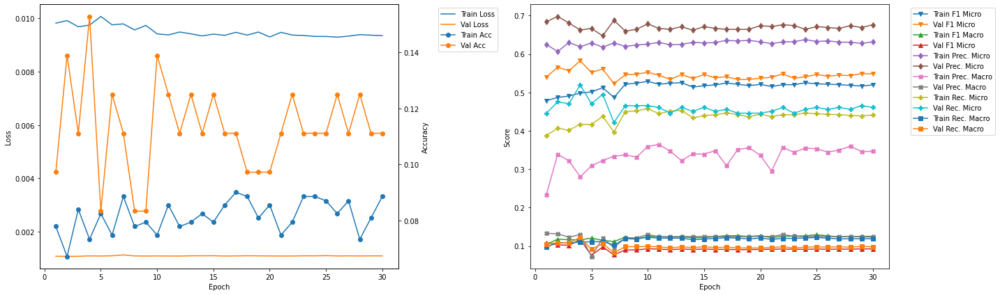

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 11
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0887 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4694 	Validation F1 Micro: 0.5841
Train F1 Marco: 0.1089 	Validation F1 Macro: 0.1
Train Precision Mirco: 0.6233 	Validation Precision Micro: 0.5869
Train Precision Marco: 0.3127 	Validation Precision Macro: 0.0813
Train Recall Mirco: 0.3764 	Validation Recall Micro: 0.5814
Train Recall Marco: 0.0971 	Validation Recall Macro: 0.1316


In [28]:
densenet169LSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = densenet169LSTM_500_1_50, DistilBert = DB_densenet169, 
                                                   training_data = training_data, learning_rate = 0.01, k_folds = 10, 
                                                   n_epochs = 30, model_name = 'densenet169LSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0169 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0303 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0076 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.66
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0068 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0058 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2308 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1818 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0034 	Validation Recall Micro: 0.0
Train Recal

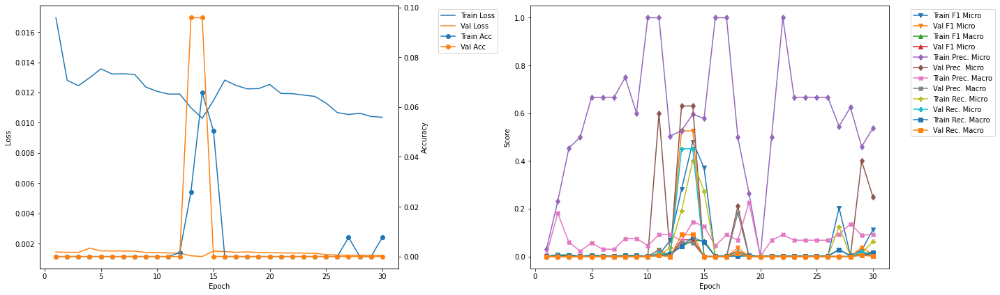

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.25
Train Loss: 0.0122 	Validation Loss: 0.0017
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0068 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1818 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1045 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0035 	Validation Recall Micro: 0.0
Train Recall Marco: 0.002 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.58
Train Loss: 0.0126 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0102 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0018 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4091 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0341 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0052 	Validation Recall Micro: 0.0
Train R

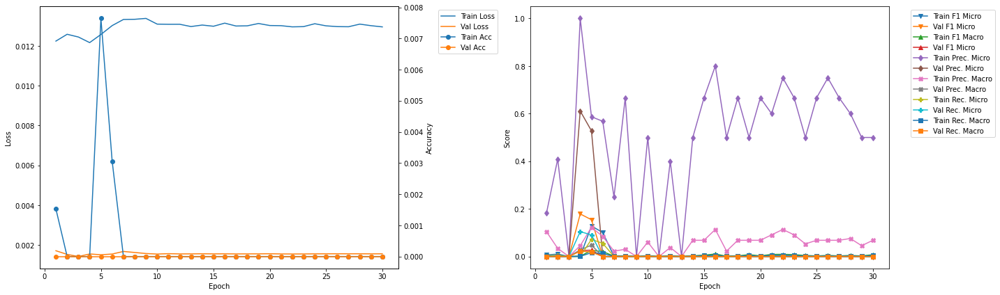

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.13
Train Loss: 0.0148 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0578 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0376 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1601 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1526 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0352 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0357 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.46
Train Loss: 0.0132 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0046 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0054 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5714 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0636 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Rec

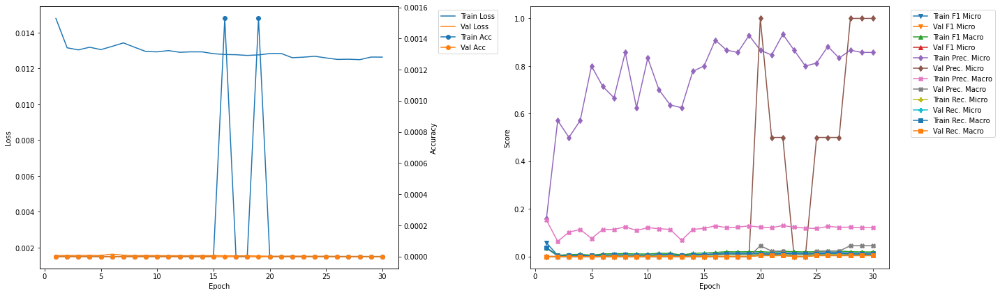

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.03
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0247 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0247 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.211 	Validation Precision Micro: 0.0
Train Precision Marco: 0.2111 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0131 	Validation Recall Micro: 0.0
Train Recall Marco: 0.014 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.36
Train Loss: 0.0131 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0091 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0145 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5333 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1074 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0046 	Validation Recall Micro: 0.0
Train Recal

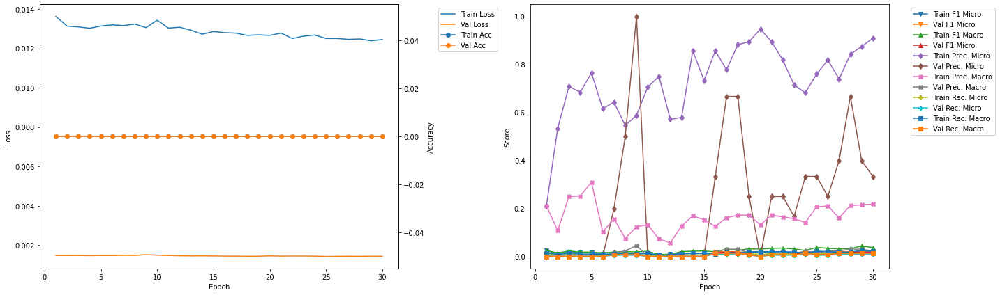

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.92
Train Loss: 0.013 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0158 	Validation F1 Micro: 0.0297
Train F1 Marco: 0.0154 	Validation F1 Macro: 0.0416
Train Precision Mirco: 0.56 	Validation Precision Micro: 1.0
Train Precision Marco: 0.2305 	Validation Precision Macro: 0.1364
Train Recall Mirco: 0.008 	Validation Recall Micro: 0.0151
Train Recall Marco: 0.0082 	Validation Recall Macro: 0.025

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.25
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0125 	Validation F1 Micro: 0.0197
Train F1 Marco: 0.0163 	Validation F1 Macro: 0.0227
Train Precision Mirco: 0.8462 	Validation Precision Micro: 0.5
Train Precision Marco: 0.1071 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0063 	Validation Recall M

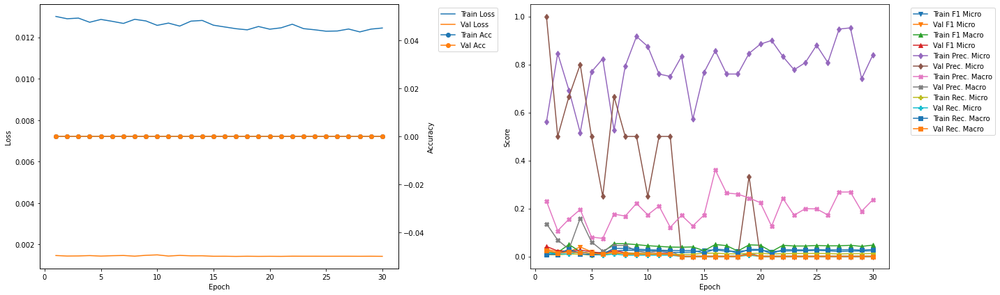

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 49.81
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0351 	Validation F1 Micro: 0.0309
Train F1 Marco: 0.0409 	Validation F1 Macro: 0.0295
Train Precision Mirco: 0.4848 	Validation Precision Micro: 0.75
Train Precision Marco: 0.1761 	Validation Precision Macro: 0.0758
Train Recall Mirco: 0.0182 	Validation Recall Micro: 0.0158
Train Recall Marco: 0.0258 	Validation Recall Macro: 0.0195

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.14
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0288 	Validation F1 Micro: 0.0206
Train F1 Marco: 0.0441 	Validation F1 Macro: 0.0202
Train Precision Mirco: 0.5652 	Validation Precision Micro: 0.5
Train Precision Marco: 0.1749 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0148 	Validat

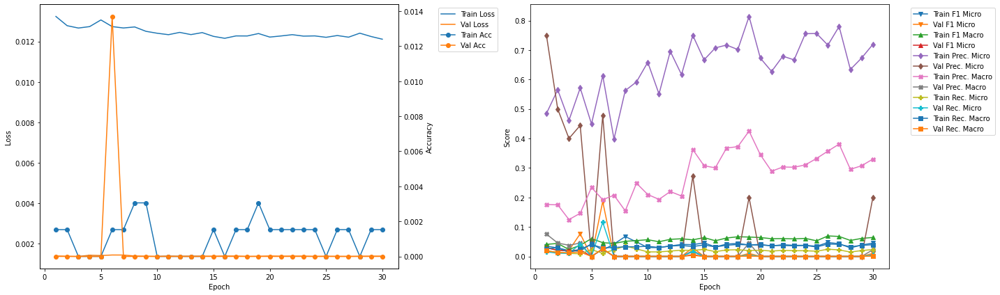

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.71
Train Loss: 0.0134 	Validation Loss: 0.0013
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.102 	Validation F1 Micro: 0.0521
Train F1 Marco: 0.0407 	Validation F1 Macro: 0.0333
Train Precision Mirco: 0.4286 	Validation Precision Micro: 0.7143
Train Precision Marco: 0.1808 	Validation Precision Macro: 0.0795
Train Recall Mirco: 0.0579 	Validation Recall Micro: 0.027
Train Recall Marco: 0.0267 	Validation Recall Macro: 0.0215

Epoch 2 	Learning Rate: 0.01 	Time (min): 60.03
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.048 	Validation F1 Micro: 0.0417
Train F1 Marco: 0.0301 	Validation F1 Macro: 0.0277
Train Precision Mirco: 0.6111 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.1669 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.025 	Valida

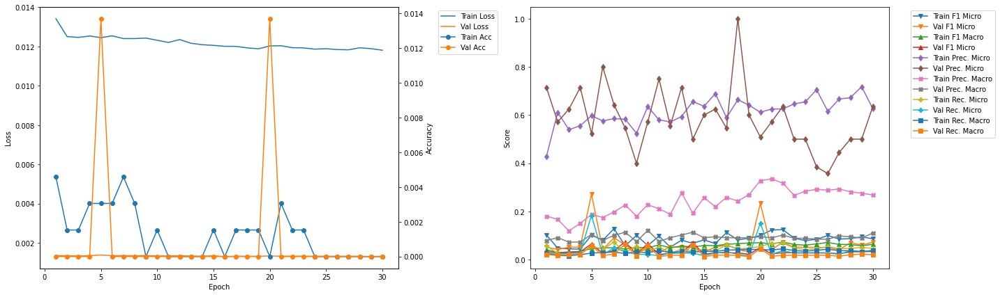

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.6
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1544 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0848 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4459 	Validation Precision Micro: 0.0
Train Precision Marco: 0.3894 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0934 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0542 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.93
Train Loss: 0.0122 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1263 	Validation F1 Micro: 0.0725
Train F1 Marco: 0.0961 	Validation F1 Macro: 0.0141
Train Precision Mirco: 0.6294 	Validation Precision Micro: 0.5385
Train Precision Marco: 0.2439 	Validation Precision Macro: 0.0289
Train Recall Mirco: 0.0702 	Validation Recall Mic

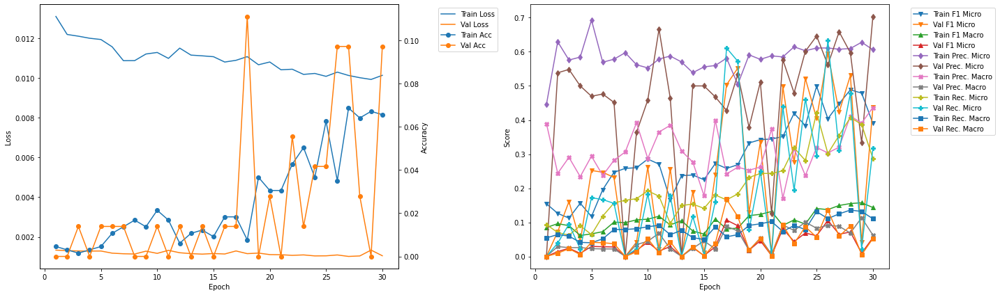

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 79.53
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4188 	Validation F1 Micro: 0.4645
Train F1 Marco: 0.1314 	Validation F1 Macro: 0.1497
Train Precision Mirco: 0.5813 	Validation Precision Micro: 0.5455
Train Precision Marco: 0.2196 	Validation Precision Macro: 0.2483
Train Recall Mirco: 0.3273 	Validation Recall Micro: 0.4045
Train Recall Marco: 0.1089 	Validation Recall Macro: 0.1349

Epoch 2 	Learning Rate: 0.01 	Time (min): 79.86
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4691 	Validation F1 Micro: 0.4307
Train F1 Marco: 0.148 	Validation F1 Macro: 0.1234
Train Precision Mirco: 0.6177 	Validation Precision Micro: 0.6146
Train Precision Marco: 0.2991 	Validation Precision Macro: 0.2326
Train Recall Mirco: 0.3782

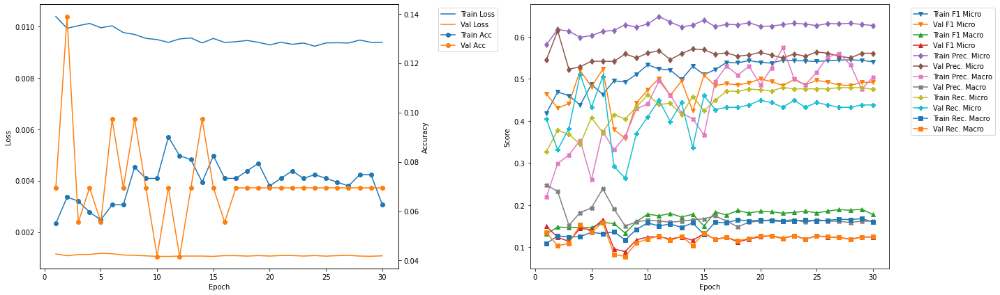

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 89.43
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.469 	Validation F1 Micro: 0.5546
Train F1 Marco: 0.151 	Validation F1 Macro: 0.1294
Train Precision Mirco: 0.6208 	Validation Precision Micro: 0.6225
Train Precision Marco: 0.4033 	Validation Precision Macro: 0.2082
Train Recall Mirco: 0.3769 	Validation Recall Micro: 0.5
Train Recall Marco: 0.1247 	Validation Recall Macro: 0.1423

Epoch 2 	Learning Rate: 0.01 	Time (min): 89.76
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.162 	Validation F1 Macro: 0.0961
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.6093
Train Precision Marco: 0.4208 	Validation Precision Macro: 0.1056
Train Recall Mirco: 0.423 	Vali

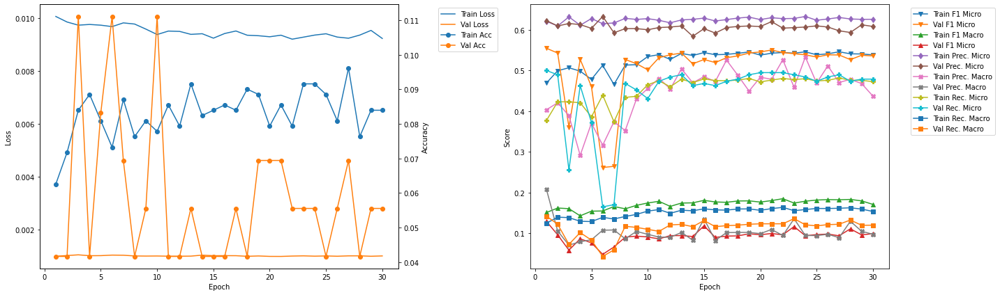

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 26
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0351 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4039 	Validation F1 Micro: 0.5953
Train F1 Marco: 0.1373 	Validation F1 Macro: 0.1056
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.3036 	Validation Precision Macro: 0.0913
Train Recall Mirco: 0.3016 	Validation Recall Micro: 0.6333
Train Recall Marco: 0.1109 	Validation Recall Macro: 0.1355


In [29]:
densenet201LSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = densenet201LSTM_500_1_50, DistilBert = DB_densenet201, 
                                                   training_data = training_data, learning_rate = 0.01, 
                                                   k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.37
Train Loss: 0.0166 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.076 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0458 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1157 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0825 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0566 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0515 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.036765).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.75
Train Loss: 0.0122 	Validation Loss: 0.0019
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1573 	Validation F1 Micro: 0.0368
Train F1 Marco: 0.029 	Validation F1 Macro: 0.0058
Train Precision Mirco: 0.5015 	Validation Precision Micro: 0.0685
Train Precision Marco: 0.0552 	Validation

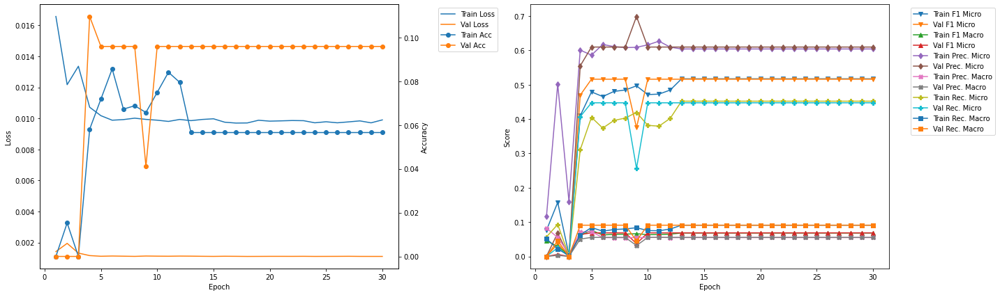

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.4
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.4472
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0595
Train Precision Mirco: 0.6251 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.066 	Validation Precision Macro: 0.0448
Train Recall Mirco: 0.3823 	Validation Recall Micro: 0.4091
Train Recall Marco: 0.0754 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.76
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.4472
Train F1 Marco: 0.0778 	Validation F1 Macro: 0.0595
Train Precision Mirco: 0.5879 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0448
Train Recall Mirco: 0.4342 	Va

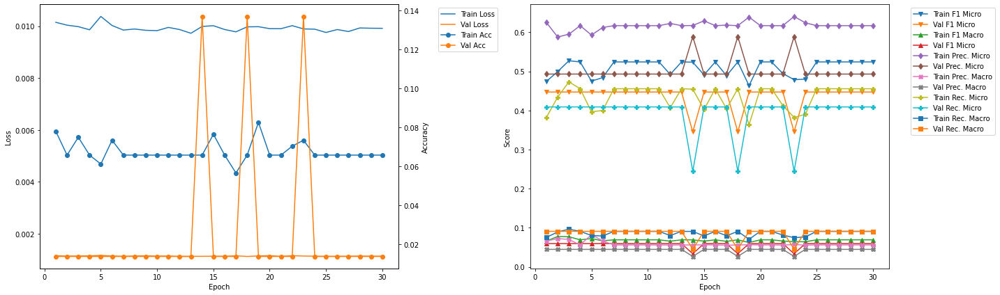

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.515942 --> 0.538922).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 22.39
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4861 	Validation F1 Micro: 0.5389
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4031 	Validation Recall Micro: 0.4787
Train Recall Marco: 0.0805 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.76
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5145 	Validation F1 Micro: 0.5389
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision M

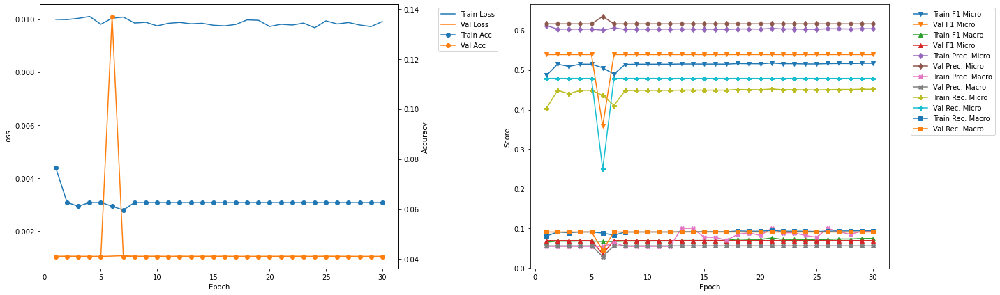

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.538922 --> 0.557864).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 33.39
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.472 	Validation F1 Micro: 0.5579
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0806
Train Precision Mirco: 0.6075 	Validation Precision Micro: 0.6395
Train Precision Marco: 0.0825 	Validation Precision Macro: 0.1034
Train Recall Mirco: 0.3859 	Validation Recall Micro: 0.4947
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0966

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.76
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.513 	Validation F1 Micro: 0.5562
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0796
Train Precision Mirco: 0.6003 	Validation Precision Micro: 0.6351
Train Precision Mar

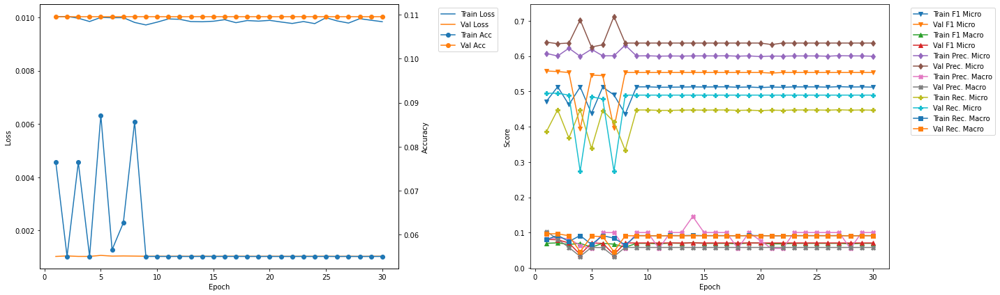

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.35
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5137 	Validation F1 Micro: 0.546
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0881
Train Precision Mirco: 0.6011 	Validation Precision Micro: 0.6259
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0802
Train Recall Mirco: 0.4485 	Validation Recall Micro: 0.4842
Train Recall Marco: 0.0916 	Validation Recall Macro: 0.105

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.72
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0883
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.6284
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.08
Train Recall Mirco: 0.4485 	Vali

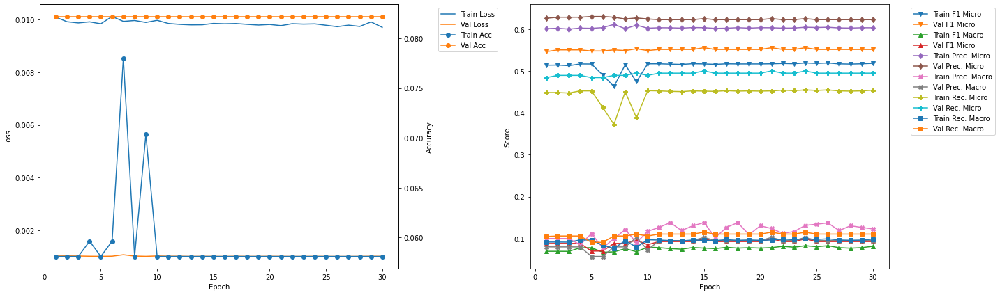

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.31
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4677 	Validation F1 Micro: 0.5444
Train F1 Marco: 0.0698 	Validation F1 Macro: 0.0921
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6216
Train Precision Marco: 0.1081 	Validation Precision Macro: 0.1015
Train Recall Mirco: 0.3813 	Validation Recall Micro: 0.4842
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.1061

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.68
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.084 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.6174
Train Precision Marco: 0.1034 	Validation Precision Macro: 0.0863
Train Recall Mirco: 0.457

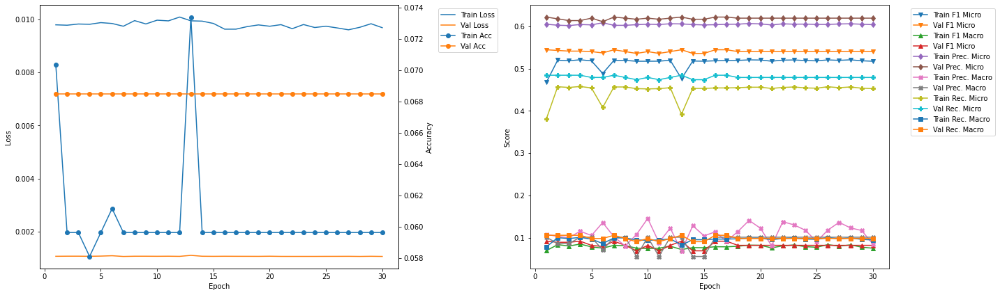

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 66.3
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.5107 	Validation F1 Micro: 0.3636
Train F1 Marco: 0.0788 	Validation F1 Macro: 0.0606
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.6753
Train Precision Marco: 0.0877 	Validation Precision Macro: 0.1063
Train Recall Mirco: 0.4379 	Validation Recall Micro: 0.2488
Train Recall Marco: 0.0927 	Validation Recall Macro: 0.061

Epoch 2 	Learning Rate: 0.01 	Time (min): 66.66
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5057 	Validation F1 Micro: 0.4958
Train F1 Marco: 0.0787 	Validation F1 Macro: 0.0898
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.5933
Train Precision Marco: 0.084 	Validation Precision Macro: 0.0876
Train Recall Mirco: 0.435 	

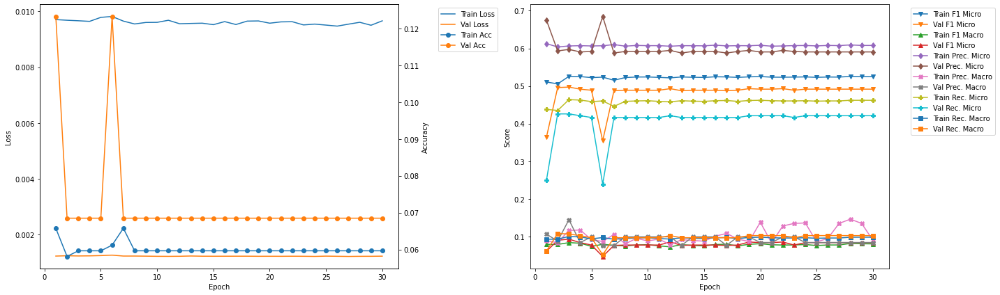

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 77.26
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4933 	Validation F1 Micro: 0.5412
Train F1 Marco: 0.073 	Validation F1 Macro: 0.0985
Train Precision Mirco: 0.6011 	Validation Precision Micro: 0.6216
Train Precision Marco: 0.0882 	Validation Precision Macro: 0.1319
Train Recall Mirco: 0.4182 	Validation Recall Micro: 0.4792
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.1104

Epoch 2 	Learning Rate: 0.01 	Time (min): 77.63
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5171 	Validation F1 Micro: 0.5385
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0892
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0851 	Validation Precision Macro: 0.1016
Train Recall Mirco: 0.4524 

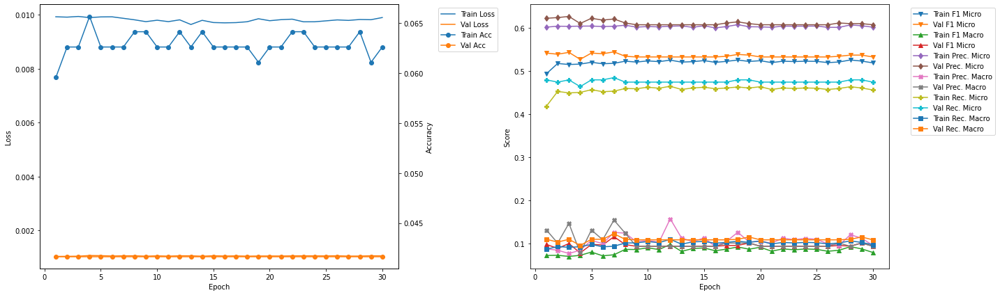

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 88.23
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4336 	Validation F1 Micro: 0.295
Train F1 Marco: 0.0872 	Validation F1 Macro: 0.0607
Train Precision Mirco: 0.5873 	Validation Precision Micro: 0.5541
Train Precision Marco: 0.1594 	Validation Precision Macro: 0.1021
Train Recall Mirco: 0.3437 	Validation Recall Micro: 0.201
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0601

Epoch 2 	Learning Rate: 0.01 	Time (min): 88.59
Train Loss: 0.0101 	Validation Loss: 0.0013
Train Accuracy: 0.0794 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4456 	Validation F1 Micro: 0.4099
Train F1 Marco: 0.0776 	Validation F1 Macro: 0.0755
Train Precision Mirco: 0.6027 	Validation Precision Micro: 0.5593
Train Precision Marco: 0.0985 	Validation Precision Macro: 0.0757
Train Recall Mirco: 0.3534

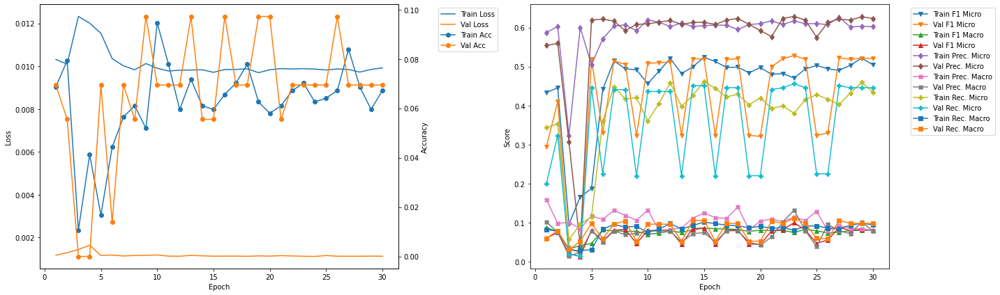

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 99.19
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5037 	Validation F1 Micro: 0.5098
Train F1 Marco: 0.0804 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.6149
Train Precision Marco: 0.0843 	Validation Precision Macro: 0.0896
Train Recall Mirco: 0.4298 	Validation Recall Micro: 0.4354
Train Recall Marco: 0.093 	Validation Recall Macro: 0.1061

Epoch 2 	Learning Rate: 0.01 	Time (min): 99.56
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5222 	Validation F1 Micro: 0.5112
Train F1 Marco: 0.0787 	Validation F1 Macro: 0.0913
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.619
Train Precision Marco: 0.0805 	Validation Precision Macro: 0.101
Train Recall Mirco: 0.4603

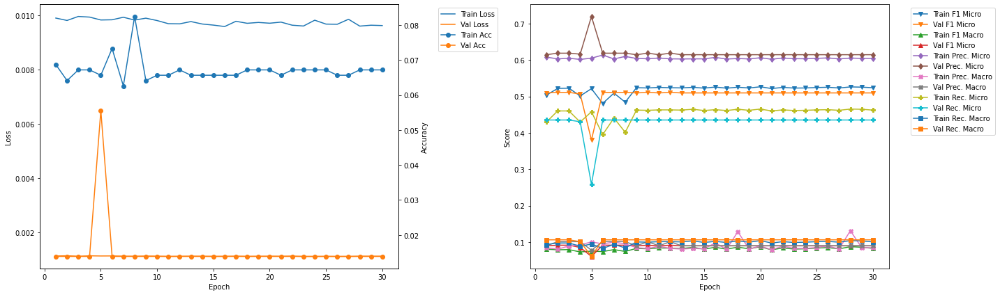

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.472 	Validation F1 Micro: 0.5579
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0806
Train Precision Mirco: 0.6075 	Validation Precision Micro: 0.6395
Train Precision Marco: 0.0825 	Validation Precision Macro: 0.1034
Train Recall Mirco: 0.3859 	Validation Recall Micro: 0.4947
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0966


In [30]:
vgg11bnLSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = vgg11bnLSTM_500_1_50, DistilBert = DB_vgg11bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0153 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0184 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0181 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0605 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0469 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0109 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0156 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.76
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

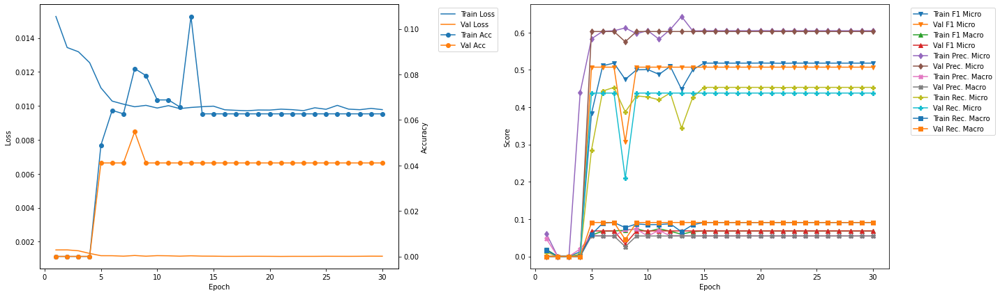

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.83
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5077 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4374 	Validation Recall Micro: 0.43
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.21
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.5914 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0709 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4276 

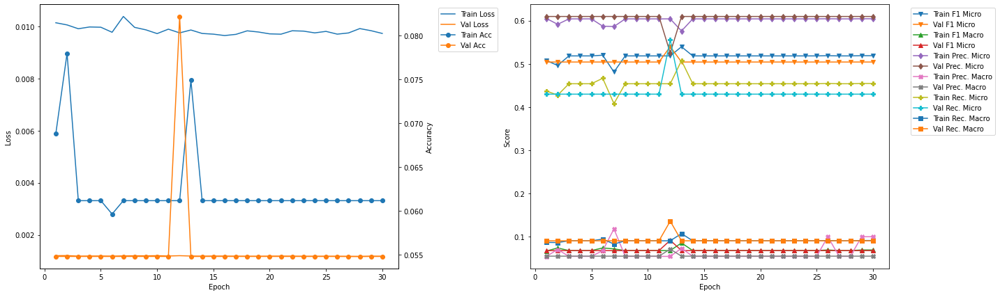

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.3
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4539 	Validation Recall Micro: 0.4307
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.68
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4539 	Valid

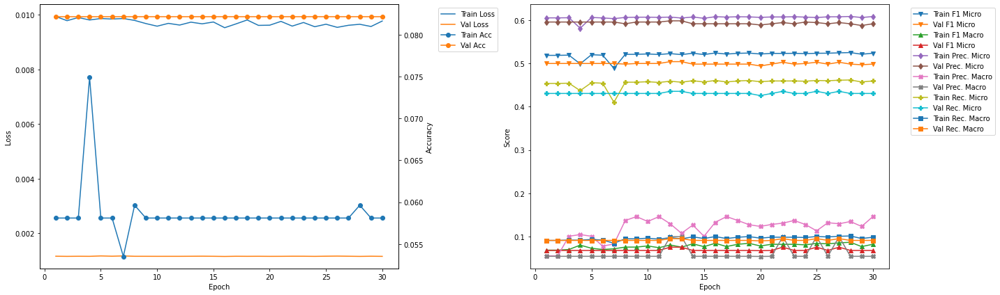

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.73
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5206 	Validation F1 Micro: 0.5072
Train F1 Marco: 0.0748 	Validation F1 Macro: 0.0809
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5986
Train Precision Marco: 0.1066 	Validation Precision Macro: 0.0996
Train Recall Mirco: 0.4562 	Validation Recall Micro: 0.44
Train Recall Marco: 0.0943 	Validation Recall Macro: 0.0985

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.12
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5176 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0745 	Validation F1 Macro: 0.096
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.1307 	Validation Precision Macro: 0.1451
Train Recall Mirco: 0.4533 

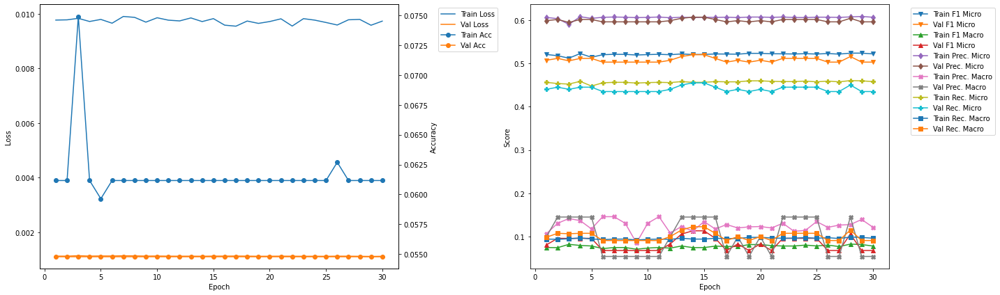

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.16
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.52 	Validation F1 Micro: 0.5394
Train F1 Marco: 0.0804 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.5965 	Validation Precision Micro: 0.6054
Train Precision Marco: 0.1631 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4609 	Validation Recall Micro: 0.4863
Train Recall Marco: 0.0975 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.539906 --> 0.541033).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.59
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5145 	Validation F1 Micro: 0.541
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6096
Train Precision M

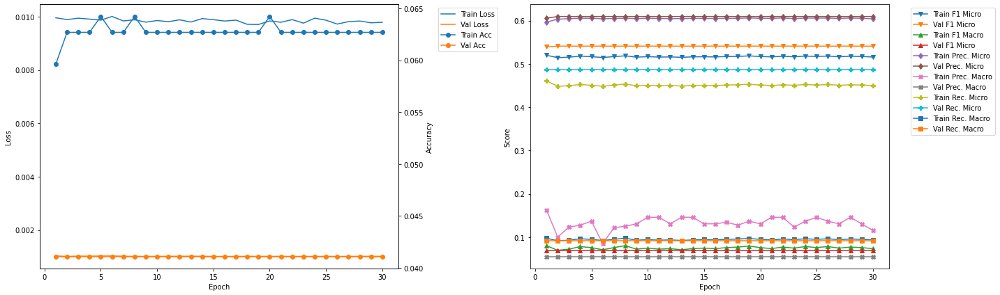

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 57.64
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5223 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0785 	Validation F1 Macro: 0.0878
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.5811
Train Precision Marco: 0.1159 	Validation Precision Macro: 0.1432
Train Recall Mirco: 0.4581 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.0964 	Validation Recall Macro: 0.1031

Epoch 2 	Learning Rate: 0.01 	Time (min): 58.02
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.521 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0738 	Validation F1 Macro: 0.0878
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5811
Train Precision Marco: 0.1159 	Validation Precision Macro: 0.1432
Train Recall Mirco: 0.455

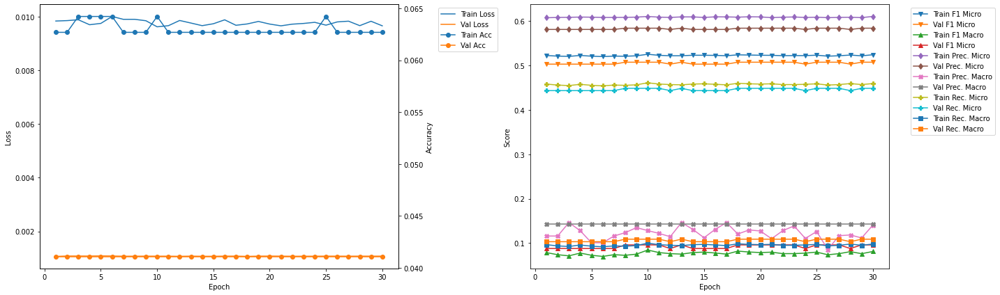

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.541033 --> 0.542274).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 69.12
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5176 	Validation F1 Micro: 0.5423
Train F1 Marco: 0.0789 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6014 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1114 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4543 	Validation Recall Micro: 0.4721
Train Recall Marco: 0.0969 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.5
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4888 	Validation F1 Micro: 0.5423
Train F1 Marco: 0.0726 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.637
Train Precisi

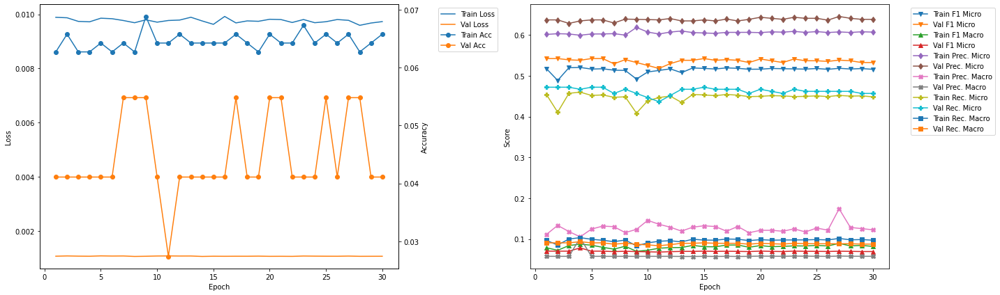

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.542274 --> 0.548896).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 80.6
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.5489
Train F1 Marco: 0.0965 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.5889 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1342 	Validation Precision Macro: 0.0557
Train Recall Mirco: 0.4651 	Validation Recall Micro: 0.5029
Train Recall Marco: 0.1063 	Validation Recall Macro: 0.09

Epoch 2 	Learning Rate: 0.01 	Time (min): 80.98
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5165 	Validation F1 Micro: 0.5397
Train F1 Marco: 0.085 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6064 	Validation Precision Micro: 0.5986
Train Precision Mar

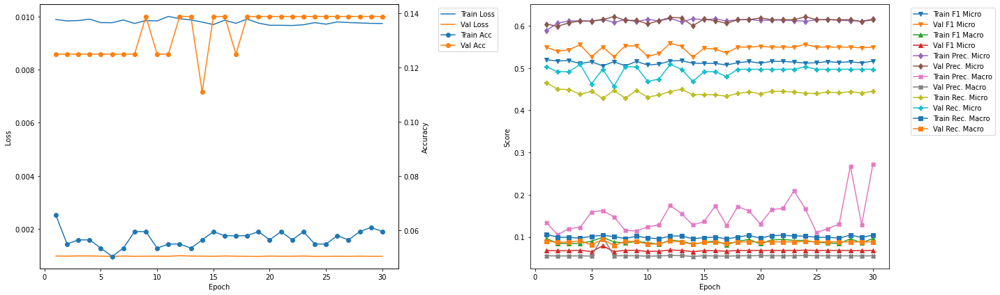

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 92.13
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.4969
Train F1 Marco: 0.0864 	Validation F1 Macro: 0.0751
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.5674
Train Precision Marco: 0.1094 	Validation Precision Macro: 0.0743
Train Recall Mirco: 0.4473 	Validation Recall Micro: 0.442
Train Recall Marco: 0.0988 	Validation Recall Macro: 0.0965

Epoch 2 	Learning Rate: 0.01 	Time (min): 92.51
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5238 	Validation F1 Micro: 0.4954
Train F1 Marco: 0.0934 	Validation F1 Macro: 0.0834
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.1525 	Validation Precision Macro: 0.0962
Train Recall Mirco: 0.4581 	V

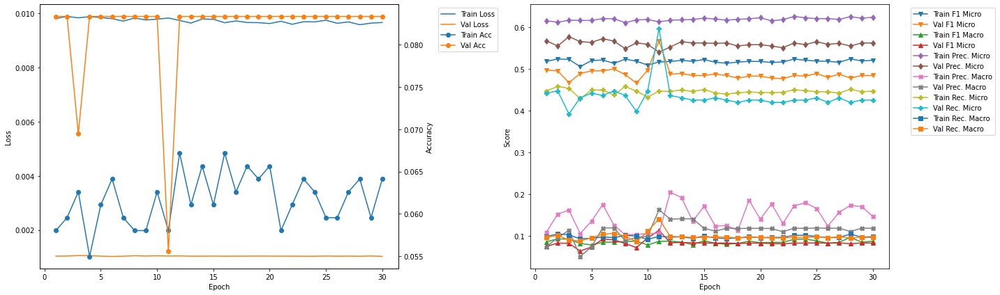

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 103.58
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5134 	Validation F1 Micro: 0.5398
Train F1 Marco: 0.0789 	Validation F1 Macro: 0.0991
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.6643
Train Precision Marco: 0.16 	Validation Precision Macro: 0.1508
Train Recall Mirco: 0.4459 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0947 	Validation Recall Macro: 0.1063

Epoch 2 	Learning Rate: 0.01 	Time (min): 103.97
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5155 	Validation F1 Micro: 0.5577
Train F1 Marco: 0.0835 	Validation F1 Macro: 0.1256
Train Precision Mirco: 0.6012 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.1169 	Validation Precision Macro: 0.162
Train Recall Mirco: 0.451

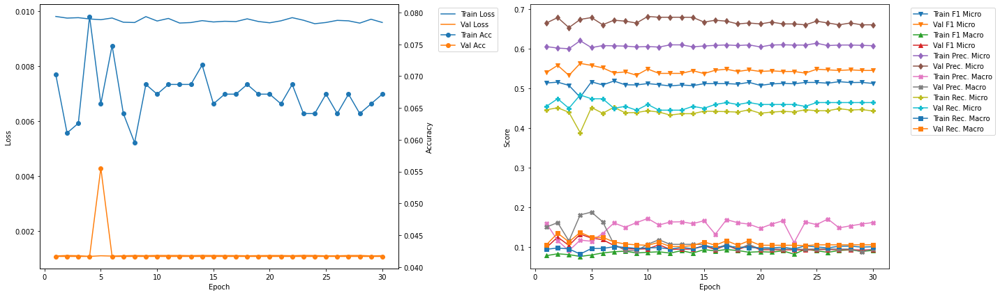

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 11
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5167 	Validation F1 Micro: 0.5669
Train F1 Marco: 0.0876 	Validation F1 Macro: 0.1137
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.54
Train Precision Marco: 0.1068 	Validation Precision Macro: 0.1632
Train Recall Mirco: 0.4468 	Validation Recall Micro: 0.5967
Train Recall Marco: 0.0997 	Validation Recall Macro: 0.1413


In [31]:
vgg16bnLSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = vgg16bnLSTM_500_1_50, DistilBert = DB_vgg16bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.0152 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0633 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0502 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1069 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1187 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0449 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0488 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.549254).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.8
Train Loss: 0.0123 	Validation Loss: 0.0011
Train Accuracy: 0.0031 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.0179 	Validation F1 Micro: 0.5493
Train F1 Marco: 0.0032 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.64 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0291 	Validati

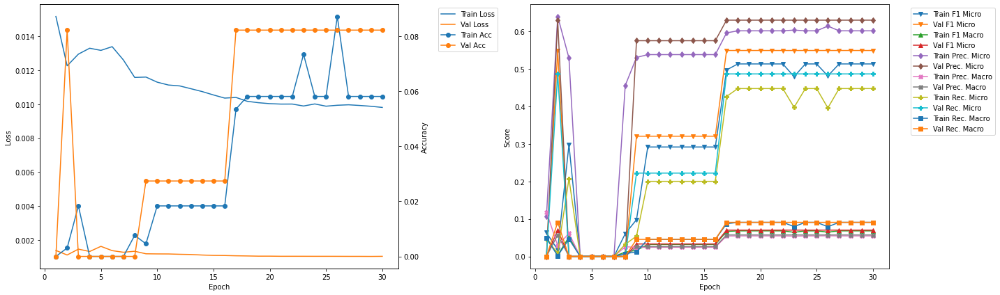

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.13
Train Loss: 0.0117 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.161 	Validation F1 Micro: 0.2814
Train F1 Marco: 0.0332 	Validation F1 Macro: 0.0306
Train Precision Mirco: 0.4526 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.0819 	Validation Precision Macro: 0.023
Train Recall Mirco: 0.0979 	Validation Recall Micro: 0.1947
Train Recall Marco: 0.0268 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.52
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3665 	Validation F1 Micro: 0.494
Train F1 Marco: 0.053 	Validation F1 Macro: 0.0657
Train Precision Mirco: 0.5817 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.2675 	V

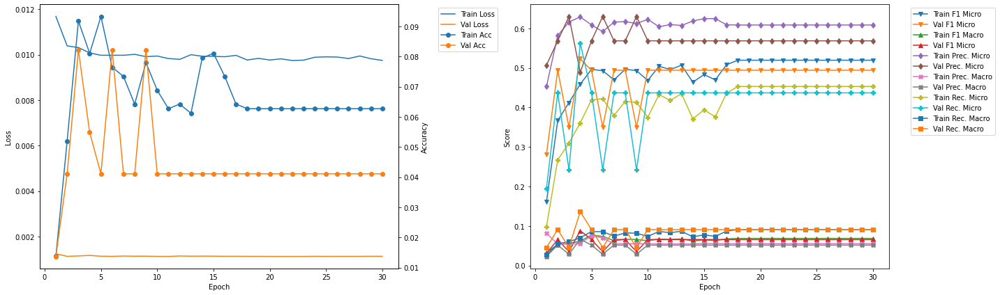

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.85
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4958 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6104 	Validation Precision Micro: 0.0
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.4174 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0837 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.25
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4587 	Validation F1 Micro: 0.5123
Train F1 Marco: 0.074 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.5811 	Validation Precision Micro: 0.5724
Train Precision Marco: 0.0749 	Validation Precision Macro: 0.052
Train Recall Mirco: 0.379 	Validation Recall Micro

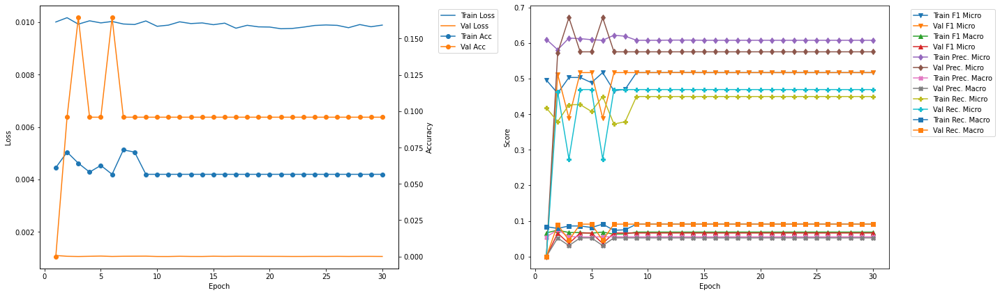

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.58
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4704 	Validation F1 Micro: 0.35
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6145 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.381 	Validation Recall Micro: 0.2367
Train Recall Marco: 0.075 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.97
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5012 	Validation F1 Micro: 0.5326
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6042 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4282 	V

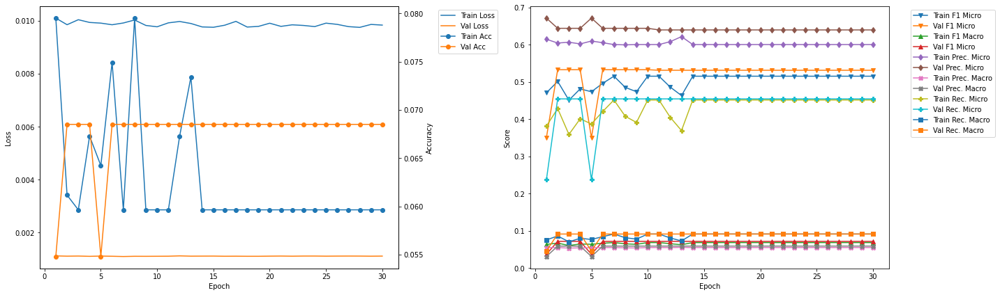

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.3
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.513 	Validation F1 Micro: 0.3799
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.5989 	Validation Precision Micro: 0.726
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.4486 	Validation Recall Micro: 0.2573
Train Recall Marco: 0.0908 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.549254 --> 0.551136).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.71
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4696 	Validation F1 Micro: 0.5511
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6644
Train Precision 

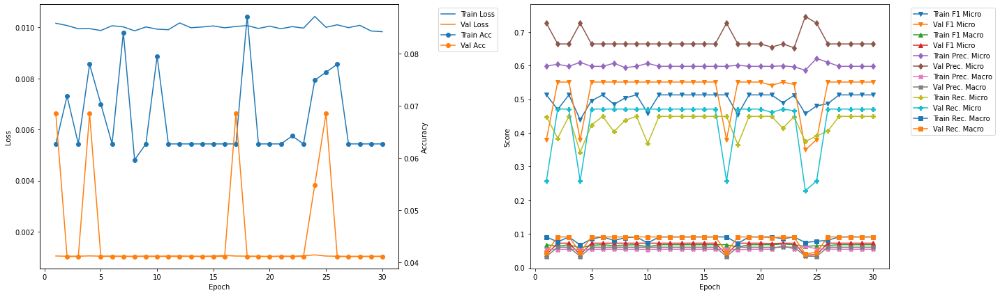

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.04
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5208 	Validation F1 Micro: 0.48
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0625
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4531 	Validation Recall Micro: 0.4358
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.43
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5208 	Validation F1 Micro: 0.48
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0619
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.1012 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4531 	

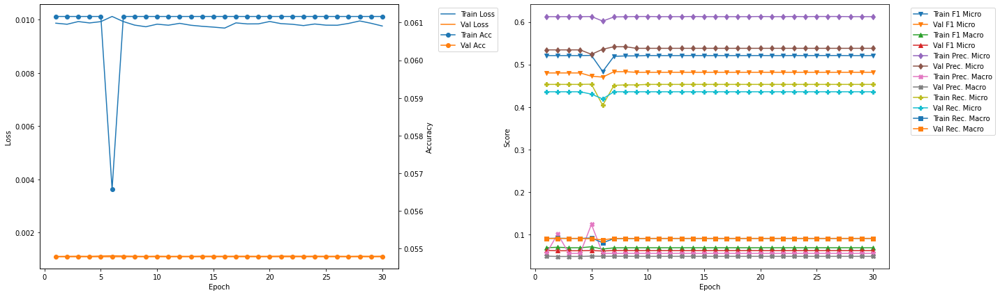

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 70.77
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5196 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4538 	Validation Recall Micro: 0.4308
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 71.16
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5196 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4538

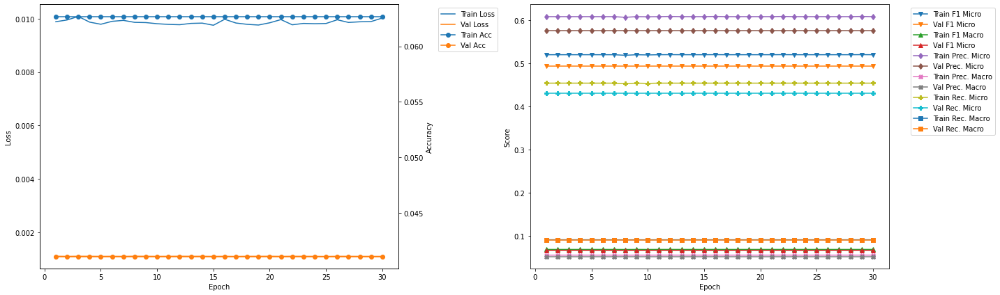

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 82.49
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5209 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6043 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4578 	Validation Recall Micro: 0.3973
Train Recall Marco: 0.0908 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 82.88
Train Loss: 0.0097 	Validation Loss: 0.0013
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5214 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.458

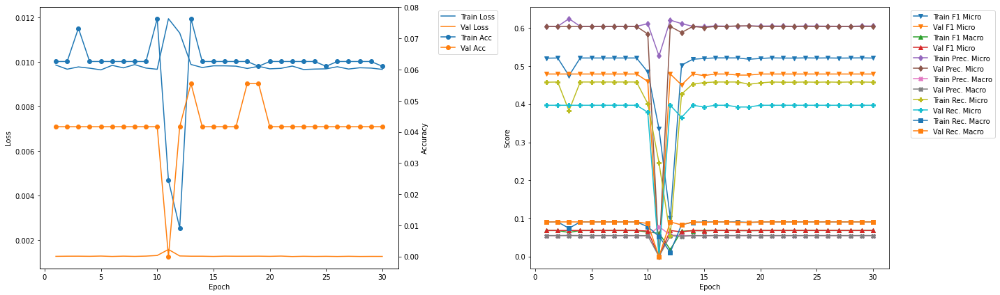

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 94.22
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0809 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4748 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.613 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3874 	Validation Recall Micro: 0.4721
Train Recall Marco: 0.0769 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 94.61
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.457 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.0614 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.622 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3611 	V

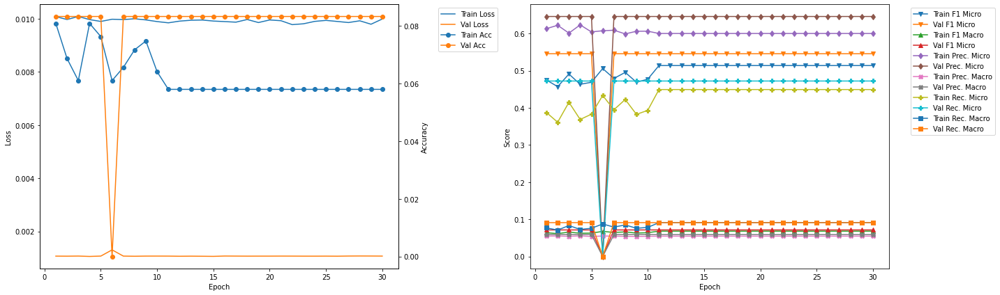

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 105.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0885 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4869 	Validation F1 Micro: 0.3488
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6185 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.4015 	Validation Recall Micro: 0.2419
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 106.33
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4808 	Validation F1 Micro: 0.3488
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6235 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.3913 

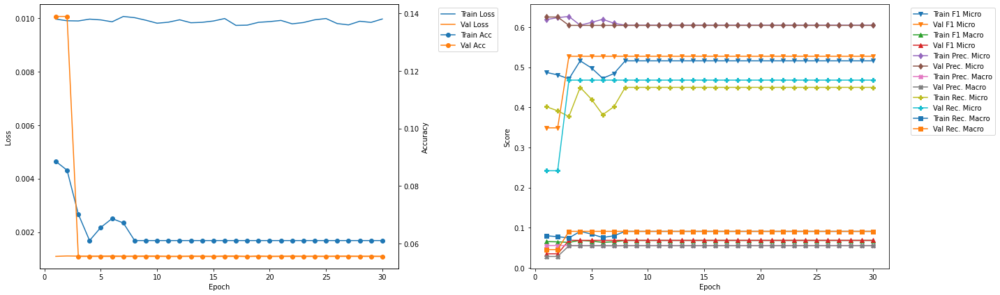

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 2
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4696 	Validation F1 Micro: 0.5511
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.3843 	Validation Recall Micro: 0.4709
Train Recall Marco: 0.0762 	Validation Recall Macro: 0.0909


In [32]:
vgg19bnLSTM_500_1_50_best = Kfold_train_CNN_RNN_DB(CNN = vgg19bnLSTM_500_1_50, DistilBert = DB_vgg19bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_50_DB')

In [33]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 14:31:22


## Training Summary

### Summary Table

In [34]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_500_1_50_best,
    'ResNet50' : resnet50LSTM_500_1_50_best,
    'ResNet101' : resnet101LSTM_500_1_50_best,
    'DenseNet121' : densenet121LSTM_500_1_50_best,
    'DenseNet169' : densenet169LSTM_500_1_50_best,
    'DenseNet201' : densenet201LSTM_500_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_500_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_500_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_500_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,1.000000,10.000000,1.000000,6.000000,7.000000,8.000000,4.000000,9.000000,5.000000
Epoch,15.000000,2.000000,12.000000,6.000000,11.000000,26.000000,1.000000,11.000000,2.000000
Train Loss,0.010252,0.009986,0.009943,0.009898,0.009790,0.010292,0.010030,0.009830,0.010073
Train Accuracy,0.055046,0.067176,0.074924,0.065749,0.088685,0.035115,0.076453,0.058015,0.071865
Train F1 Micro,0.450973,0.487040,0.450273,0.494915,0.469402,0.403941,0.471981,0.516699,0.469638
Train F1 Macro,0.062048,0.065281,0.060142,0.107554,0.108920,0.137304,0.069562,0.087628,0.062961
Train Precision Micro,0.588181,0.602532,0.600583,0.611903,0.623327,0.611239,0.607527,0.612578,0.603791
Train Precision Macro,0.053610,0.054181,0.052932,0.278664,0.312675,0.303568,0.082532,0.106828,0.053753
Train Recall Micro,0.365672,0.408701,0.360140,0.415481,0.376443,0.301641,0.385885,0.446772,0.384262
Train Recall Macro,0.074495,0.082103,0.070809,0.105484,0.097148,0.110933,0.079910,0.099656,0.076234


In [35]:
summaryDF.to_csv('BestCnnRnnDBModels/BestModels_500_1_50.csv')

### Training Summary Graph

In [36]:
import plotly
import plotly.graph_objects as go

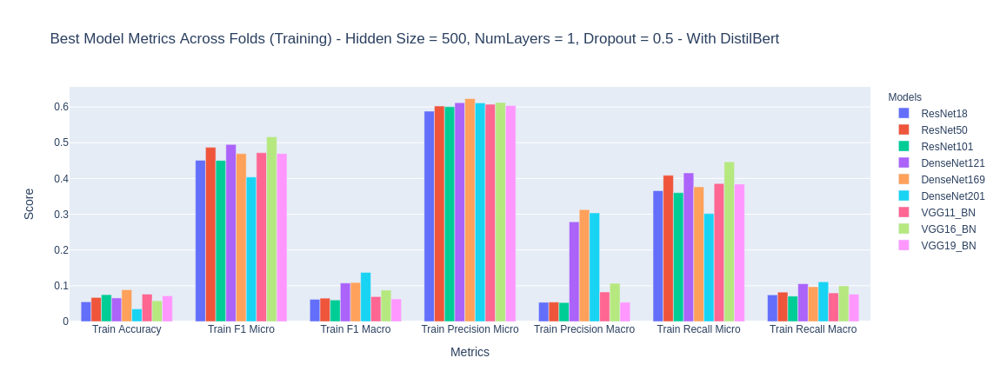

In [37]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5 - With DistilBert',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

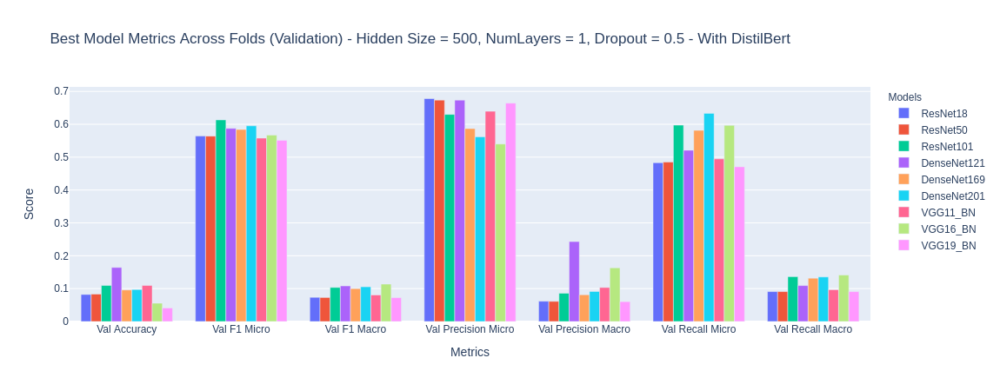

In [38]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5 - With DistilBert',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

# 
# 
# 